#<h1 align = 'center'>TEAM ID:  PTID-CDS-JAN-24-1772
<h1 align= 'center'>PROJECT ID: PRCP-1009-CellphonePrice  


## **BUSINESS CASE:**
<p align = 'justify'>Bob has started his own mobile company. He wants to give a tough fight to big companies like Apple, Samsung etc.
He does not know how to estimate the price of mobiles his company creates. In this competitive mobile phone market, you cannot simply assume things. To solve this problem he collects sales data of mobile phones of various companies.
Bob wants to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory etc) and its selling price. But he is not so good at Machine Learning. So he needs your help to solve this problem.
In this problem you do not have to predict the actual price but a price range indicating how high the price is.

#### PROBLEM STATEMENT

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:-On the basis of the mobile Specification like Battery power, 3G enabled , wifi ,Bluetooth, Ram etc predict the Price range of the mobile.

Task 3:- Prepare the analysis report stating how model will help expanding the business by stating several factors including feature importance.


## **IMPORTING BASIC LIBRARIES:**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

## **IMPORTING THE DATASET:**

In [6]:
pd.set_option('display.max_columns', None)
data = pd.read_csv(r"C:\Users\shanu\Downloads\MAIN PROJECTS\Main-Projects\Cellphone price prediction\cellphone_price_train_data.csv")
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


## **DOMAIN ANALYSIS:**

-  This dataset provides the price range of cell phones based on their respective specifications.
- The target variable is the 'price_range' and the the factors affecting the price_range are taken as the independent features such as follows:
<ol>
<li>battery_power- Total energy a battery can store in one time measured in mAh(milliampere-hour)i.e., it shows how long a device will run before the battery charge is run out.</li>
<li>blue- whether the device has the bluetooth or not</li>
<li>clock_speed- speed at which the microprocessor executes instructions</li>
<li>dual_sim- has dual sim or not</li>
<li>fc- front camera (Megapixels)</li>
<li>four_g- has 4G or not</li>
<li>int_memory- Internal memory in(gigabytes)</li>
<li>m_dep- mobile depth in(Cm):
<ol type= 'i'>
<li>"mobile depth" typically refers to the thickness or the measurement of the phone from the front face to the back face.</li>
<li>It represents how slim or thick the phone is. A thinner phone is generally considered more sleek and modern, while a thicker phone might accommodate larger batteries, additional features, or structural elements.</li>
<li>mobile phones typically have depths ranging from around 7 mm to 10 mm, with some flagship models even thinner, measuring below 7 mm, depends on individual preferences and priorities, such as design, functionality, and ergonomics.</li></ol>
<li>mobile_wt- Weight of mobile phone:
<ol type='i'>
<li>The weight of mobile phones can vary based on factors such as the device's size, materials, components, and features. Generally, modern smartphones are designed to be lightweight and portable, but their weights can still vary significantly.</li>
<li>Here's a rough breakdown of mobile phone weights:</li>
<dd>-Entry-level and budget smartphones: 100-150 grams</dd>
<dd>-Mid-range smartphones: 150-200 grams</dd>
<dd>-Flagship and premium smartphones: 150-250 grams</dd></ol>
<li>n_cores- Number of cores of processor
<li>pc- primary camera (Megapixels):
<ol type= 'i'>
<li>The primary camera in a cellphone, often referred to simply as the "main camera," is the primary imaging system on the device. It's the rear-facing camera that's typically used for taking photos and videos.</li>
<li>Any modern smartphones offer primary camera resolutions ranging from around 12 megapixels to as high as 108 megapixels.</li>
<li>However, the number of megapixels alone does not determine the overall image quality. Factors such as sensor size, pixel size, lens quality, image processing algorithms, and optical stabilization also play crucial roles in determining the quality of photos and videos captured by a smartphone camera.</li></ol>
<li>px_height- Pixel resolution height
<li>px-weight- pixel resolution width
<li>ram- Random access memory in(Megabytes)
<li>sc_h- Screen height of mobile in Cm:
<ol type= 'i'>
<li>Screen heights are typically measured diagonally, from one corner of the screen to the opposite corner. The most common screen sizes for smartphones typically fall between 5 inches and 6.5 inches diagonally.</li>
<li>In terms of general specifications in centimeters, a screen size of around 12 to 17 centimeters (approximately 4.7 to 6.7 inches) diagonally is common for modern smartphones. However, this can vary depending on the aspect ratio and design of the phone's display.</li></ol>
<li>sc_w- Screen width  mobile in cm:
<ol type= 'i'>
<li> the most common screen widths for smartphones typically fall between 5 centimeters (approximately 2 inches) and 10 centimeters (approximately 4 inches).</li></ol>
<li>talk_time- Longest time that a single battery charge will last when you are constantly talking on the phone
<li>three_g- has 3G or not
<li>touch_screen- has touch screen or not
<li>wifi- has wifi or not
- The target variable 'price_range' has the following categories:
<ul>
<li>0- Low cost
<li>1- Medium cost
<li>2- High cost
<li>3- Very High cost


## BASIC CHECKS:

In [7]:
# viewing dimension of the data

x= data.shape
print(x)
print(f'rows: {x[0]}\ncolumns: {x[1]}')

(2000, 21)
rows: 2000
columns: 21


In [8]:
# first five rows

data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [9]:
# last five records

data.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


In [10]:
# column names

data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [11]:
# showing datatypes

data.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

#### Insights:
- All the columns shows the numerical datatypes of int and float.
- clock_speed and m_dep shows float64 datatype.
- The rest of the features have int64 datatype.

In [ ]:
# Basic information about the features

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
# Insights:
# There are no null values and all the features are of numerical datatypes.

In [ ]:
# Statistical information

data.describe().T.sort_values('std', ascending = False)\
.style.background_gradient(cmap='flare')



,count,mean,std,min,25%,50%,75%,max
ram,2000.000000,2124.213000,1084.732044,256.000000,1207.500000,2146.500000,3064.500000,3998.000000
px_height,2000.000000,645.108000,443.780811,0.000000,282.750000,564.000000,947.250000,1960.000000
battery_power,2000.000000,1238.518500,439.418206,501.000000,851.750000,1226.000000,1615.250000,1998.000000
px_width,2000.000000,1251.515500,432.199447,500.000000,874.750000,1247.000000,1633.000000,1998.000000
mobile_wt,2000.000000,140.249000,35.399655,80.000000,109.000000,141.000000,170.000000,200.000000
int_memory,2000.000000,32.046500,18.145715,2.000000,16.000000,32.000000,48.000000,64.000000
pc,2000.000000,9.916500,6.064315,0.000000,5.000000,10.000000,15.000000,20.000000
talk_time,2000.000000,11.011000,5.463955,2.000000,6.000000,11.000000,16.000000,20.000000
sc_w,2000.000000,5.767000,4.356398,0.000000,2.000000,5.000000,9.000000,18.000000
fc,2000.000000,4.309500,4.341444,0.000000,1.000000,3.000000,7.000000,19.000000


#### Insights:
- Each feature has 2000 records with no null values.
- The average of **RAM** is around 2124 megabytes ranging from minimum of 256MB to maximum of 4000MB.
- The **px_height** has mean value of 645 with a minimum value of 0 and maximum of 1960. The **minimum pixel height** for cell phones can vary depending on factors such as the device's screen size, resolution, and aspect ratio. However in modern smartphones, the minimum pixel height for a usable display is typically around 480 pixels or higher for smaller screens. Hence this minimum value needs to be corrected.
- The averge value of the **battery power** is around 1240mAh ranging from a minimum of 500mAh and maximum of 2000mAh.
- The average **px_width** is around 1250 with a minimum of 500 to a maximum of 2000.
- The average **mobile_wt** is around 140g with a minimum of 80g and a maximum of 200g.
- The mean **int_memory** is around 32GB. The minimum value is around 2GB and a maximum of 64GB.
- The rest of the features have discrete values. But there are certain features that show minimum values, which do not seem to be rational. They are:
<dl>
<dt>m_dep(mobile depth in cm)
<dd>- shows minimum value as 0.1cm (1mm) whereas most of the smartphones have a minimum thickness ranging from around 6mm to 10mm.
<dt>px_height (pixel resolution height)
<dd>-The minimum value is 0 here, but in modern smartphones, the minimum pixel height for a usable display is typically around 480 pixels or higher for smaller screens
<dt>sc_w(screen width in cm)
<dd>- the data shows 0cm as the minimum value whereas smartphones typically have screen widths ranging from around 2 inches (5.08cm) to 6 inches or more.



In [12]:
# no of unique elements in each of the columns

data.nunique().to_frame().T.style.background_gradient(cmap='flare')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1094,2,26,2,20,2,63,10,121,8,21,1137,1109,1562,15,19,19,2,2,2,4


#### Insights:
Based on the count of unique values in all the features, it is clear as such follows:
<dl>
<dt>Continuous features
<dd>- battery_power, clock_speed, int_memory, mobile_wt, px_height, px_width, ram.
<dt>discrete features
<dd>- blue, dual_sim, fc, four_g, m_dep, n_cores, pc, sc_h, sc_w, talk_time, three_g, touch_screen, wifi.

## EXPLORATORY DATA ANALYSIS:

### UNIVARIATE ANALYSIS:


#### Distribution of Categorical/ discrete and numerical features:

In [ ]:
target= 'price_range'
independent_features= [column for column in data.drop(target, axis=1)]

# let's take a threshold of less than 25 unique values for a feature to be
# considered as a categorical feature
categorical_features= [column for column in independent_features if data[column].nunique() < 25]
continuous_features= [column for column in independent_features if data[column].nunique() >=25]

print(f'Target variable: {target}\nTotal no of independent features (except target): {len(independent_features)}')
print(f'No of categorical features (<25 distinct values): {len(categorical_features)}')
print(f'No of continuous features: {len(continuous_features)}')

Target variable: price_range
Total no of independent features (except target): 20
No of categorical features (<25 distinct values): 13
No of continuous features: 7


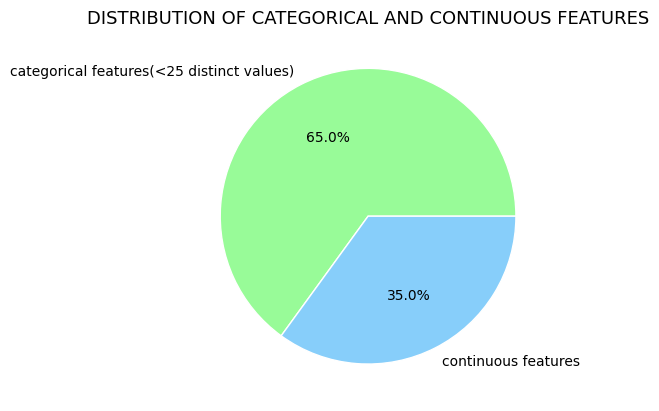

In [ ]:
# pie chart showing the distribution
plt.pie([len(categorical_features), len(continuous_features)],
        labels= ['categorical features(<25 distinct values)', 'continuous features'],
        colors= ['palegreen','lightskyblue'],
        textprops= {'fontsize': 10},
        wedgeprops= {'edgecolor': 'white'},
        autopct= '%.1f%%')

plt.title('DISTRIBUTION OF CATEGORICAL AND CONTINUOUS FEATURES', fontsize= 13)
plt.show()

#### Target variable:

In [ ]:
value_counts= data['price_range'].value_counts()
value_counts
# 0- Low cost
# 1- Medium cost
# 2- High cost
# 3- Very High cost

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64

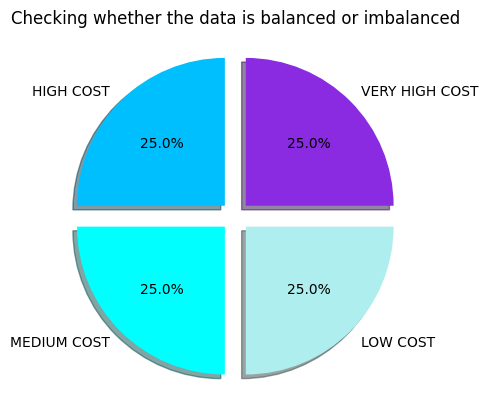

In [ ]:
# defining labels and colors

labels= [f'{"VERY HIGH COST" if i==0 else "HIGH COST" if i ==1 else "MEDIUM COST" if i ==2 else "LOW COST"}'
         for i in range(len(value_counts))]

colors= ['blueviolet', 'deepskyblue', 'aqua', 'paleturquoise']

# creating piechart by plotting the percentage values of unique values

fig, ax= plt.subplots()
ax.pie(value_counts.values,
       labels= labels,
       colors= colors,
       autopct= '%.1f%%',
       explode= [0.1, 0.1, 0.1, 0.1],
       shadow= True)


plt.title('Checking whether the data is balanced or imbalanced')
plt.show()

##### Insights:
- The above piechart shows that the target variable has the equal count in all the classes. Hence the data is completely balanced.

#### Analysis of Categorical features:

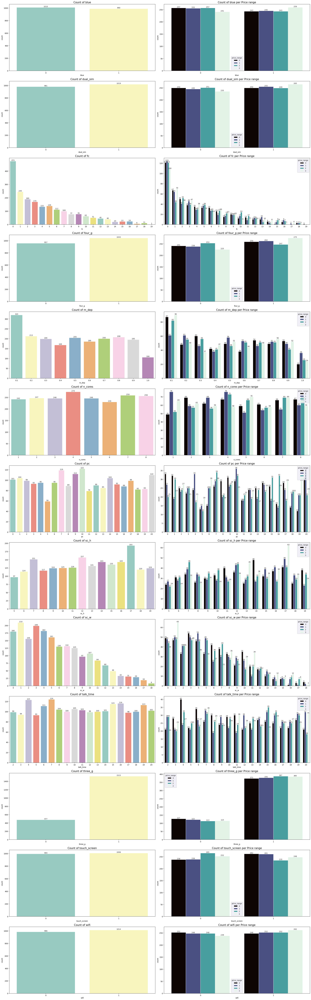

In [ ]:
fig, axes = plt.subplots(13,2, figsize=(25,80))
sns.set_style('darkgrid')
plotnumber = 0

for column in categorical_features:
  if plotnumber<14:
    sns.countplot(data=data, x=column, palette='Set3', ax=axes[plotnumber][0])\
    .set_title(f'Count of {column}', fontsize='15')  #accessing first column of the current subplot

    for container in axes[plotnumber][0].containers:
        axes[plotnumber][0].bar_label(container)

    sns.countplot(data=data, x=column, palette='mako', orient='v',  hue='price_range',ax=axes[plotnumber][1])\
    .set_title(f'Count of {column} per Price range', fontsize='15') #accessing the second column of the current subplot

    for container in axes[plotnumber][1].containers:
        axes[plotnumber][1].bar_label(container)
    plotnumber +=1
plt.tight_layout()
plt.show()

##### Insights:

**Bluetooth**
- The cell phones without bluetooth have slightly the higher frequency than the ones with bluetooth.
- The **count of blue per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones without bluetooth, </li>
<dd>the low-cost and high-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with bluetooth,</li>
<dd>the very high cost phones constitute the majority.</dd></ul>

**Dual Sim**
- Cell phones with Dual Sim have the highest frequency.
-The **count of dual_sim per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones without dual sim, </li>
<dd>the low-cost and high-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with dual sim,</li>
<dd>the very high cost phones constitute the majority.</dd></ul>

**front camera**
- Cell phones with front camera of 0 megapixels have the highest frequency. It shows the majority of cellphones has either no front camera or very lowest resolution with inability to capture any meaningful detail.
-The **count of fc per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 0 megapixels, </li>
<dd>-the medium-cost phones have the highest frequency.</dd>
<dd>-the very high_cost phones have the lowest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with the next highest category of megapixels,</li>
<dd>-the very high cost phones constitute the majority.</dd>
<li>However the frequency of very high cost cell phones do not show any stable consistent decrease or increase in frequency with respect to the front camera's megapixels's trend in the chart. It varies randomly irrespective of the megapixels.</li></ul>  

**4G**
- Cell phones with 4G shows the highest frequency.
-The **count of 4G per price range** shows that,
<ul type= 'disc'>
<li>In cellphones with 4G category, </li>
<dd>the low-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones without 4G,</li>
<dd>the medium cost phones constitute the majority.</dd></ul>

**mobile depth(m_dep in cm)**
- Cell phones with mobile depth of 0.1cm (1mm)shows the highest frequency but generally smartphones have depth of around 6mm to 10mm (0.6cm to 1cm). Hence clearly, the data is corrupted here.
- Mobile depth of 1cm constitutes the lowest category.
-The **count of fc per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 0.1cm of mobile depth, </li>
<dd>-the very high-cost phones and the low-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>In the lowest category of m_dep of 1cm,</li>
<dd>-the medium-cost phones constitute the majority.</dd>
</ul>

**Number of cores of processor (n_cores)**
- Cell phones with 4 cores have the highest frequency.
- mobile phones having 6 cores constitute the lowest category.  However there is no much difference between these two categories.
-The **count of n_cores per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 4 cores, </li>
<dd>-the medium-cost phones have the highest frequency.</dd>
<dd>-the very high-cost phones constitute the lowest frequency.</dd>
</ul>

**Primary camera (pc) in megapixels**
- Mobile phones with primary camera of 10 megapixels have the highest frequency followed by 7 megapixels as the next highest frequency.
- Mobile phones with 5 megapixels occupies the lowest category.
-The **count of pc per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 10 megapixels, </li>
<dd>-the medium-cost phones have the highest frequency.</dd>
<dd>-the very high_cost phones have the lowest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with the next highest category of 7 megapixels,</li>
<dd>-the high cost phones constitute the majority.</dd>
</ul>  

**screen height (in cm)**
- Cell phones with 17cm have the highest frequency followed by 12cm.
- 5 centimeters constitute the lowest frequency.
-The **count of sc_h per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 17cm, </li>
<dd>-the very high-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with the lowest category of 5cm,</li>
<dd>-the medium cost phones constitute the majority.</dd>
</ul>  

**screen width (in cm)**
- Cell phones with 1cm have the highest frequency followed by 3cm.
- 18 centimeters constitute the lowest frequency.
-The **count of sc_w per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 1cm, </li>
<dd>-the very high-cost phones have the highest frequency followed by medium cost phones.</dd>
<dd>-However, 1cm is not practically rational, since the minimum screen width of cell phones in general would be around 2 inches (5.08cm) to 6 inches.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with the lowest category of 18cm,</li>
<dd>- the low cost phones constitute the majority.</dd>
</ul>

**talk_time**
- Cell phones with talk time of 7 have the highest frequency followed by 4.
-The **count of talk_time per price range** shows that,
<ul type= 'disc'>
<li>Among cellphones with the highest category of 7, </li>
<dd>-the very high_cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones with the next highest category of 4,</li>
<dd>-the low cost phones constitute the majority.</dd>
</ul>

**3G**
- Cell phones with 3G shows the highest frequency.
-The **count of 3G per price range** shows that,
<ul type= 'disc'>
<li>In cellphones with 3G category, </li>
<dd>the high-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones without 3G,</li>
<dd>the low cost phones constitute the majority.</dd></ul>

**touch_screen**
- Cell phones with touch screen shows the highest frequency.
-The **count of touch screen per price range** shows that,
<ul type= 'disc'>
<li>In cellphones with touch screen category, </li>
<dd>the low-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones without touch screen,</li>
<dd>the high cost phones constitute the majority.</dd></ul>

**wifi**
- Cell phones with wifi shows the highest frequency.
-The **count of wifi per price range** shows that,
<ul type= 'disc'>
<li>In cellphones with wifi category, </li>
<dd>the very high-cost phones have the highest frequency.</dd>
</ul>
<ul type='disc'>
<li>Among the cell phones without wifi,</li>
<dd>the low cost phones constitute the majority.</dd></ul>


#### Analysis of numerical (continuous)features:


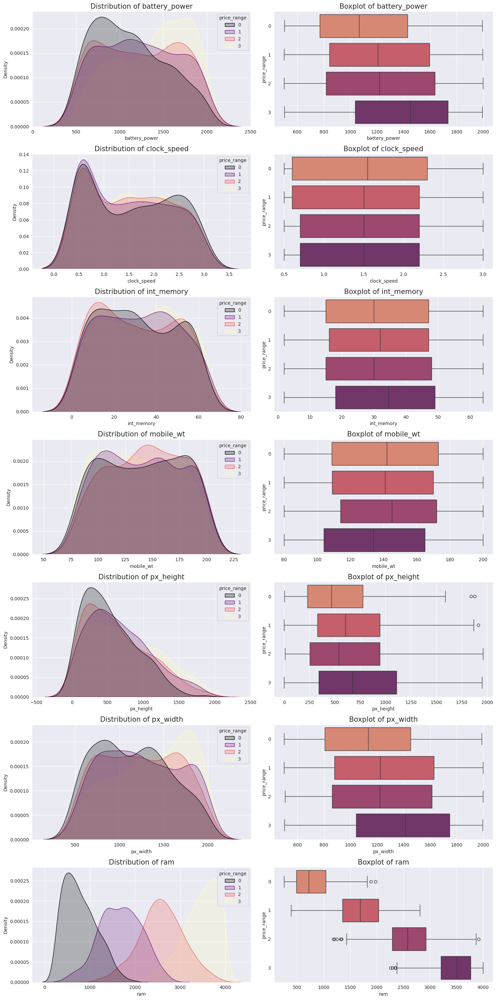

In [ ]:
# Distribution plots and boxplots are plotted to show the data distribution and
# the range of majority of distribution across all the four categories of the price range.
fig, axes= plt.subplots(7, 2, figsize= (15, 30))
sns.set_style('darkgrid')

plotnum= 0
for column in continuous_features:
  if plotnum <8:
    sns.kdeplot(data=data, x= column, hue= 'price_range',
                palette= 'magma', fill= True, ax= axes[plotnum][0])\
                 .set_title(f'Distribution of {column}', fontsize= '15')
    sns.boxplot(data= data, x= column, y= 'price_range', orient='h',
                palette= 'flare', ax= axes[plotnum][1])\
                .set_title(f'Boxplot of {column}', fontsize= '15')
    plotnum +=1
plt.tight_layout()
plt.show()


##### Insights:

- A **normal distribution** (with no skewness) is observed in the features of int_memory and mobile_wt for all price ranges.

- **Battery Power**:
<ul type= 'square'>
<li>Cell phones with the price ranges of 0, 1, 2, 3 have battery_power at the range of 600-800, 700-1350, 600-900 and 1500-1900mAh respectively.</li></ul>

- **Clock Speed**:
<ul type='square'>
<li>Cell phones with all price ranges have clock_speed at the range of 0.4-0.8.</li>
<li>A positive skewness is observed in the distribution for all price ranges.</li>
<li>The boxplot of clock_speed shows that all the price ranges have the same median equal to 1.5</li></ul>

- **Internal memory**:
<ul type= 'square'>
<li>Cell phones with the price ranges of 0, 1, 2, 3 have mostly internal memory in the range of 10-30, 35-50, 13-20, and 40-50 gigabytes respectively.</li></ul>

- **mobile weight**:
<ul type= 'square'>
<li>Mobile weight distribution curve shows roughly normal distribution.</li>
<li>The price ranges of 0, 1, 2, 3 have mobile weights mostlly around 150-180grams, 90-115grams, 130-170grams, 90-120 grams. </li></ul>

- **pixel resolution height**:
<ul type='square'>
<li>A positive skewness is visible in the distribution of px_height for all the price ranges.</li>
<li>All the price ranges mostly have pixelheight in the range of 65-500 pixels.</li></ul>

- **Pixel resolution width**:
<ul type='square'>
<li>The price ranges of 0-3 mostly have their pixel width in the range of 750-900, 700-1350, 750-1200 and 1500-1700 respectively.</li></ul>

- **RAM**:
<ul type='square'>
<li>cell phones with price ranges of 0-3 mostly have ram in the range of 450-750, 1350-1900, 2500-2800 and 3500-3950 respectively.</li>
<li>It is clear fromt the chart that the price increases as the ram increases.</li></ul>


#### Visualizing how each numerical continuous feature contribute to each class of the target variable 'price_range':

In [ ]:
pr = data.groupby(['price_range'])
target= pr.describe(percentiles=[0.25,0.5,0.75])[continuous_features]
target.style.background_gradient(cmap='Blues')

##### Insights:
- The highest mean value of battery power, int_memory, px_height, px_width, ram belong to the **very high cost** cell phones.

### BIVARIATE ANALYSIS:

In [ ]:
data.head(2)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2


#### Relationship between numerical continuous features and the target variable


In [ ]:
continuous_features

['battery_power',
 'clock_speed',
 'int_memory',
 'mobile_wt',
 'px_height',
 'px_width',
 'ram']

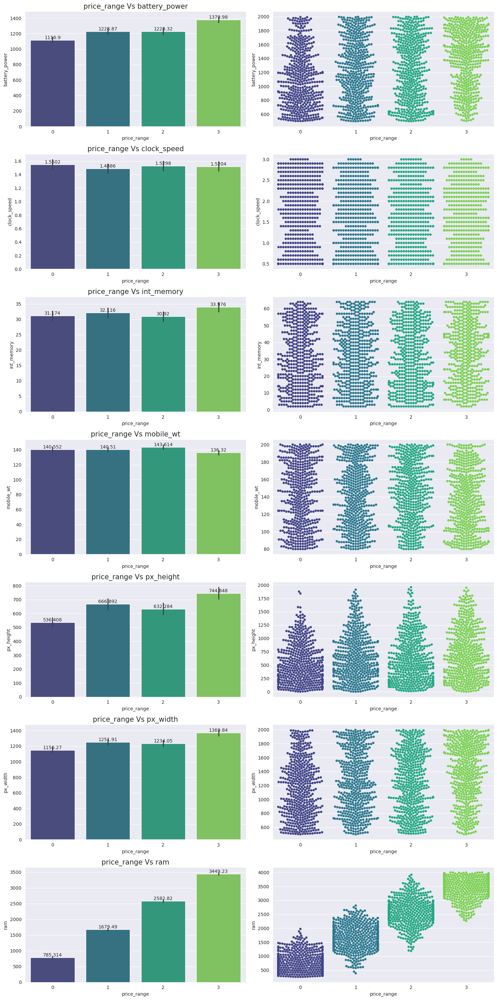

In [ ]:
# Bar plots and swarm plots are plotted to visualize the relationship between the
# continuous input features and the target variable

fig, axes= plt.subplots(7,2, figsize= (15, 30))
sns.set_style('darkgrid')
idx=0

for column in continuous_features:
  if idx <8:
       sns.barplot(data=data, x='price_range', y= column, palette='viridis', ax= axes[idx][0])\
       .set_title(f'price_range Vs {column}', fontsize= '15')

       for container in axes[idx][0].containers:
           axes[idx][0].bar_label(container)

       sns.swarmplot(data=data, x= 'price_range', y= column, palette='viridis', ax= axes[idx][1])

  idx+=1
plt.tight_layout()
plt.show()


##### **Insights:**


- **battery_power Vs price_range:**
<dl><dd>As far as battery power is concerned, the very high cost phones dominates the density as the battery power increases. The low cost phones constitute the majority of low battery power mobile ranges. Hence higher the battery power, higher the price range is.</dd></dl>
- **clock_speed Vs price_range:**
<dl><dd>In terms of clock speed, apart from the inference that the clock speed of 0.5 represents the highest count among all price ranges, there is no clear relationship between the clock speed and the the target variable.</dd></dl>
- **int_memory Vs price_range:**
<dl><dd>The very high cost phones has the majority quantity in the higher internal memory ranges. Hence higher the internal memory, higher the price range of the cellphone is.</dd></dl>
- **mobile_wt Vs price_range**:
<dl><dd>-The low cost phones have the higher mobile weight and the very high cost phones are generally seem to be of low mobile weight.</dd></dl>
<dl><dd>-Light weight and portable cell phones are seem to be in the very high price range as per the plot.</dd></dl>
- **px_height Vs price_range:**
<dl><dd>-The very high cost phones occupy the higher pixel height category.</dd>
<dl><dd>-The medium and high cost phones also slightly near to the very high cost cell phones with respect to the pixel height.</dd></dl>
<dl><dd>-But majority of low cost and very high cost phones are confined in the lower pixel heights itself which indicates that the pixel height does not necessarily influence the price ranges of the cell phones.</dd></dl>
- **px_width Vs price_range:**
<dl><dd>-The majority of low cost phones are seem to be having lower pixel widths.</dd></dl>
<dl><dd>-The very high cost price range constitute the  higher pixel widths.</dd></dl>
-**ram Vs price_range:**
<dl><dd>There is a clear relationship between the ram and the price range. As the ram increases, the price range keeps on increasing.


#### Relationship between the categorical features and the target variable:

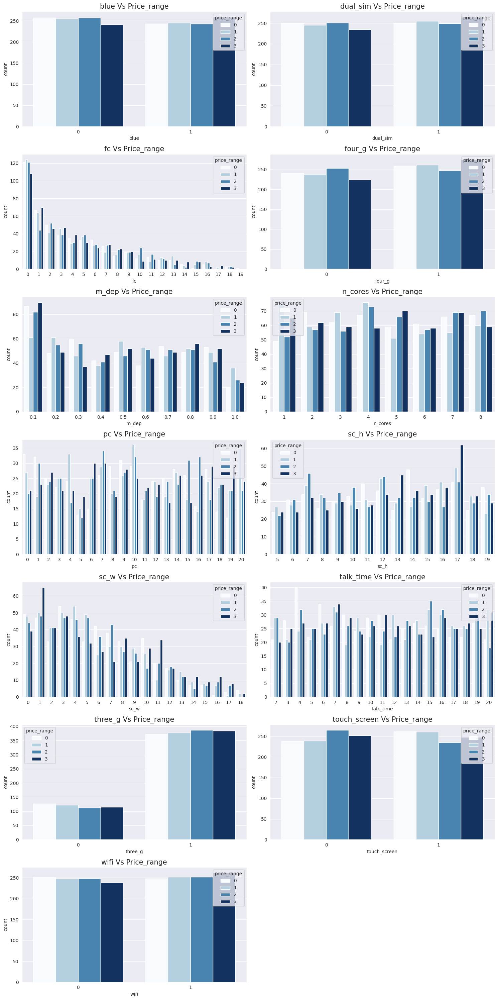

In [ ]:
plt.figure(figsize= (15, 30), facecolor= 'white')
sns.set_style('darkgrid')
plotnumber=1

for column in categorical_features:
  if plotnumber <14:
    ax= plt.subplot(7,2, plotnumber)
    sns.countplot(data= data, x= column, hue= 'price_range', palette= 'Blues')\
    .set_title(f'{column} Vs Price_range', fontsize= 15)
  plotnumber +=1
plt.tight_layout()
plt.show()

##### **Insights:**

- **blue Vs price_range:**
<dl>- Among cellphones without bluetooth, low cost phones has the more count and among cellphones with bluetooth, the very high cost phones have the most frequency.</dl>
<dl>-It clearly implies that cellphones with bluetooth facility has the cost on the very higher range.</dl>

- **dual_sim Vs price_range:**
<dl>- Among cellphones without dual_sim, low cost phones has the more count and among cellphones with dual_sim, the very high cost phones have the most frequency.</dl>
<dl>-Hence it is obvious that mobiles with dual sim have price range in the very high category comapred to the mobiles without dual sim facility.</dl>

- **fc Vs price_range:**
<dl>-Increase in the value of fc from 0-19, there seems to be a decrease in the count.</dl>
<dl>-This shows that as the front camera becomes more powerful, the number of phones decreses.</dl>

- **4G Vs price_range:**
<dl>- Among cellphones without 4G, high cost phones dominate the count whereas among the cellphones with 4G, the very high cost phones have the most frequency.</dl>
<dl>-So 4G cellphones act as the advantage for the price range to be on the higher side.</dl>

- **m_dep Vs price_range:**
<dl>-Cellphones with mobile depth of 0.1cm shows the highest count however in general, mobile depth starts from around 0.5cm, so this feature contains corrupted data.</dl>
- **n_cores Vs price_range:**
<dl>-Number of cores of 4 have the highest count with medium cost phones costituting the majority and the low cost phones occupying the least quantity.</dl>
<dl>-n_cores of 6 has the lowest count and in this group, the low cost phones has the highest frequency.</dl>

- **pc Vs price_range:**
<dl>-In general, cellphones with 5 megapixels of pc have the lowest count among all phones and phones with 10 megapixels have the highest count.</dl>
<dl>-Among phones with 10 megapixels, the medium cost phones has the highest frequency.</dl>
<dl>-However apart from 5 megapixels, the pc of other categories do not show clear relationship with the price range.</dl>

- **sc_h Vs price_range:**
<dl>-The cell phones with the screen height of 17cm have the highest count with the very high cost phones dominating the category.</dl>
<dl>-Apart from this, the trend fluctuates across screen heights of other phones, hence not clear relationship is visible.</dl>

- **sc_w Vs price_range:**
<dl>-The chart shows that the increase in screen width value leads to decrease in the count.  Hence as the screen width becomes bigger, the number of phones decreases.</dl>
<dl>-In general, the cellphones with 2.54cm(1 inch) of sc_w have the highest count among all phones apart from 1 cm of sc_w which seems odd in practicality.</dl>

- **talk_time Vs price_range:**
<dl>-The talk time varies from 2 to 20</dl>
<dl>-However, the mobile phones with talk time of 4 with the low-cost price range have the highest count among all the phones.</dl>

- **3G Vs price_range:**
<dl>- Among cellphones without 3G, low cost phones dominate the count whereas among the cellphones with 3G, the high cost phones and the very high cost phones have the most frequency.</dl>
<dl>-So in general, 3G cellphones cost higher than the ones without 3G.</dl>

- **touch_screen Vs price_range:**
<dl>- Mobile phones with touch screen shows slightly higher count than the ones without touch screen, however there is no much difference between both the counts.</dl>
<dl>-In phones with touch screen type, the low cost and the medium cost price ranges have the higher frequencies.</dl>

- **wifi Vs price_range:**
<dl>-Mobile phones with wifi shows the highest category.</dl>
<dl>-The very high cost phones lead the phones with wifi category. Hence it is clear that phones with wifi fall on the very high cost price range.</dl>

### MULTI-VARIATE ANALYSIS:

#### Analysis of the relationship among the independent features WITH RESPECT TO THE TARGET VARIABLE


In [ ]:
independent_features

['battery_power',
 'blue',
 'clock_speed',
 'dual_sim',
 'fc',
 'four_g',
 'int_memory',
 'm_dep',
 'mobile_wt',
 'n_cores',
 'pc',
 'px_height',
 'px_width',
 'ram',
 'sc_h',
 'sc_w',
 'talk_time',
 'three_g',
 'touch_screen',
 'wifi']

In [ ]:
# Since 'ram' is the one of the independent features which shows
# strong relationship with the target variable, 'ram' is compared with
# other input features and analysis is done.

#### Ram & Battery power:

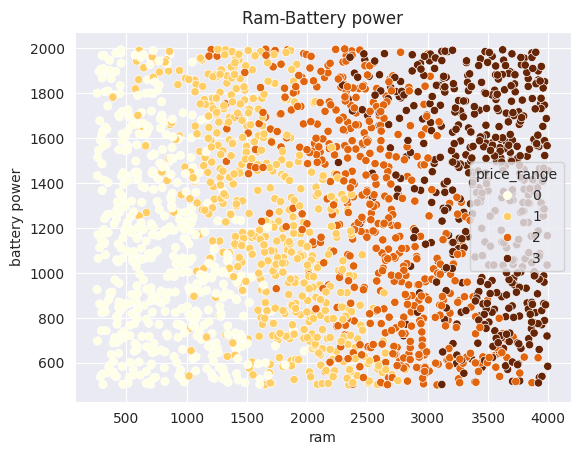

In [ ]:
sns.scatterplot(data= data, x= 'ram', y= 'battery_power', hue= 'price_range', palette= 'YlOrBr')
plt.xlabel('ram')
plt.ylabel('battery power')
plt.title('Ram-Battery power')
plt.show()

##### **Insights:**
- **Battery power** does not necessarily improve by increasing the ram of the cell phones.

#### Ram & Bluetooth:

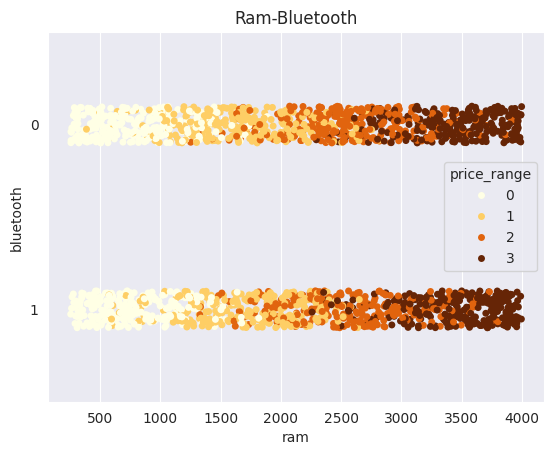

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'blue', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('bluetooth')
plt.title('Ram-Bluetooth')
plt.show()

#### Ram & Dual sim:

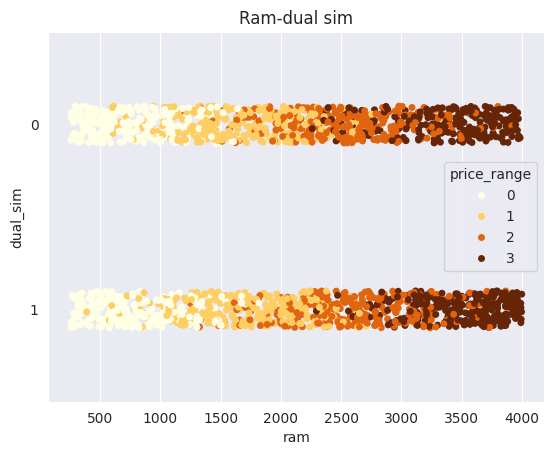

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'dual_sim', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('dual_sim')
plt.title('Ram-dual sim')
plt.show()

#### Ram & 4G:

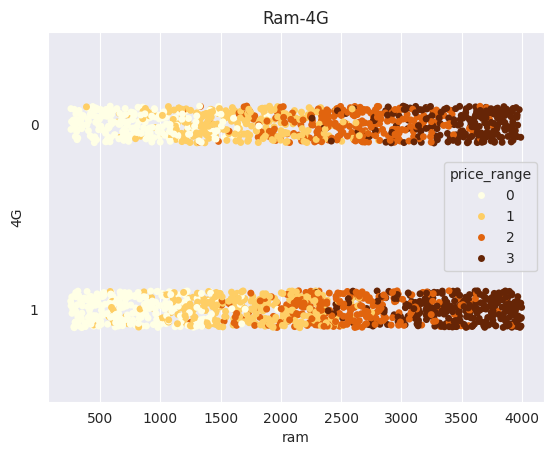

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'four_g', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('4G')
plt.title('Ram-4G')
plt.show()

#### Internal memory & Ram:

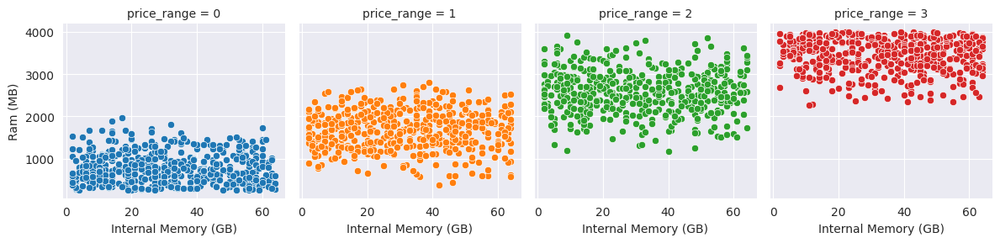

In [ ]:
x = sns.FacetGrid(data, col="price_range", hue="price_range")
x.map(sns.scatterplot, "int_memory", "ram")
x.set_axis_labels("Internal Memory (GB)", "Ram (MB)")
plt.show()

#### Ram & Number of cores:

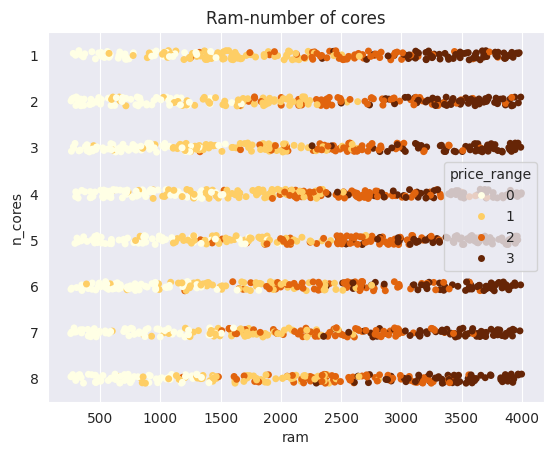

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'n_cores', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('n_cores')
plt.title('Ram-number of cores')
plt.show()

#### Ram & 3G:

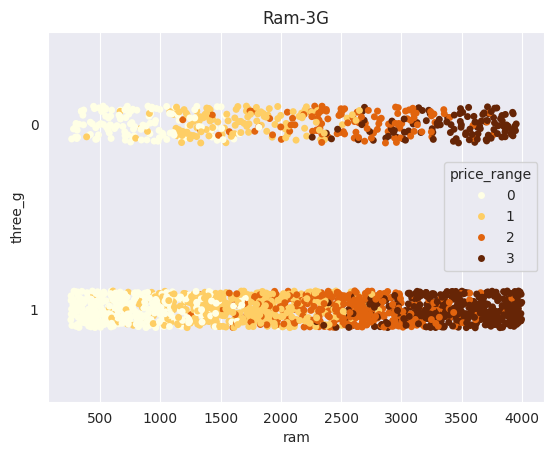

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'three_g', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('three_g')
plt.title('Ram-3G')
plt.show()

#### Ram & Touch screen:

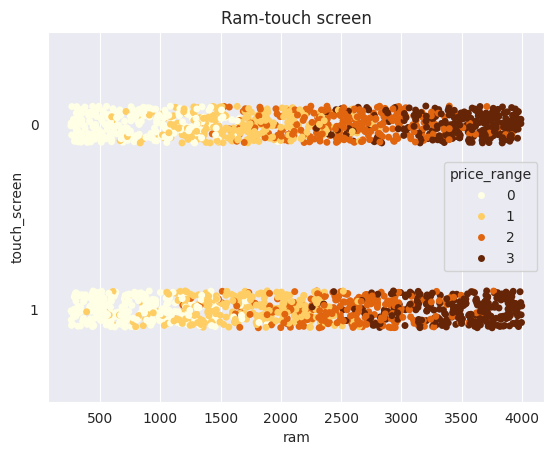

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'touch_screen', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('touch_screen')
plt.title('Ram-touch screen')
plt.show()

#### Ram & wifi:

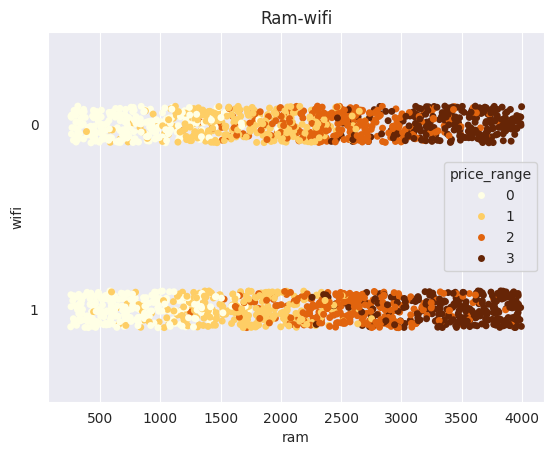

In [ ]:
sns.stripplot(data= data, x= 'ram', y= 'wifi', hue= 'price_range', palette= 'YlOrBr', orient= 'h')
plt.xlabel('ram')
plt.ylabel('wifi')
plt.title('Ram-wifi')
plt.show()

#### Display Resolution (Pixel Height x Pixel Width):

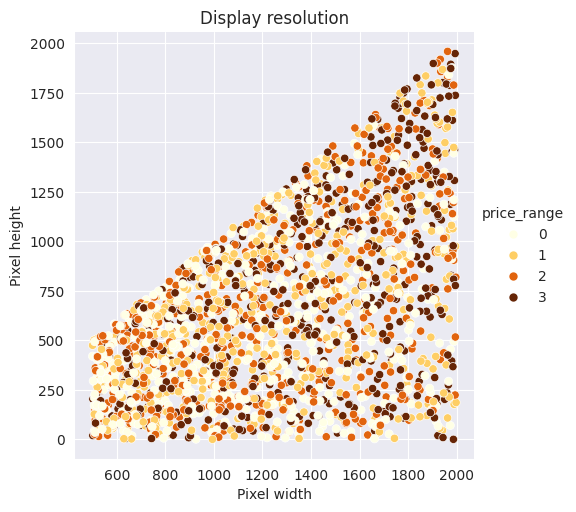

In [ ]:
sns.relplot(data=data, x= 'px_width', y= 'px_height', hue= 'price_range', palette= 'YlOrBr')
plt.xlabel('Pixel width')
plt.ylabel('Pixel height')
plt.title('Display resolution')
plt.show()

##### **Insights:**
- **Display resolution** in general, shows that by increasing the pixel height, the pixel width will also increase.

#### Screen size (Screen Height x Screen Width):

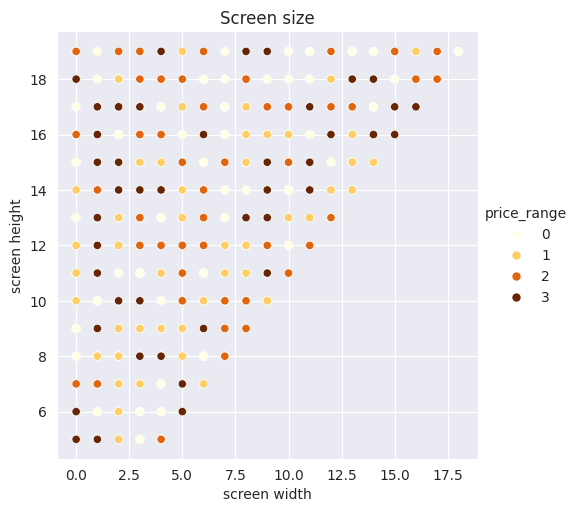

In [ ]:
sns.relplot(data=data, x= 'sc_w', y= 'sc_h', hue= 'price_range', palette= 'YlOrBr')
plt.xlabel('screen width')
plt.ylabel('screen height')
plt.title('Screen size')
plt.show()

##### **Insights:**
- **Screen size** in general, shows that by increasing the screen height, the screen width will also increase.

##### **OVERALL OBSERVATION**

- By increasing the RAM in mobile phones, it will lead to an increase in price range across all the categorical features.

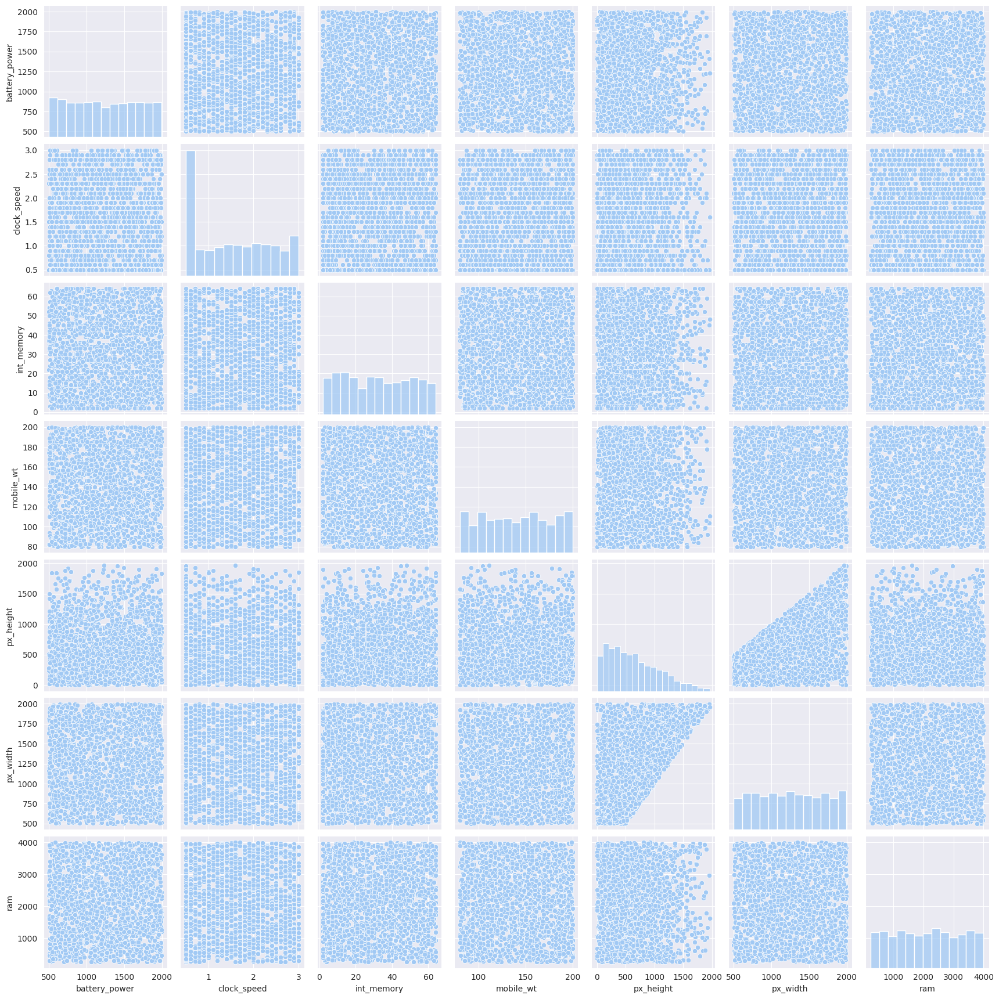

In [ ]:
sns.set_palette('pastel')
sns.pairplot(data= data.loc[:, continuous_features])
plt.show()

##### **Insights:**

- From the scatter plot, it is clear that **pixel height** and the **pixel width** have the strong positive relationship between each other.
- An extreme data point can be found in the distribution of clockspeed feature, which could be dealt with data cleaning.
- With respect to the distribution of other features, the trend is not very clear except **pixel height** which is skewed towards the left.



## DATA PREPROCESSING:


### HANDLING THE CORRUPTED DATA:

In [ ]:
# Some numerical features like m_dep, px_height and sc_w have their minimum values as 0 which needs to be
# interpreted deeply.

#### **mobile depth**

In [ ]:
data.m_dep.describe()

count    2000.000000
mean        0.501750
std         0.288416
min         0.100000
25%         0.200000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

- As mentioned earlier in the analysis part, generally smartphones have depth of around 6mm to 10mm (0.6cm to 1cm). Hence clearly, the data is corrupted here.
- The minimum range of mobile phones vary depending on the manufacturer, model and the specific phone design. Apart from general thickness range of smartphones, some highend models may be thinner than this range, with depths as low as 6mm or even more.

- **Reference:**https://www.techrankup.com/en/smartphones-thickness-ranking/


In [ ]:
# handling the corrupted data in m_dep

# Relacing all values below 0.5cm with 0.5 cm

# finding values below 0.5cm
below_threshold= data.loc[data['m_dep']<0.5]
# count of no of values below 0.5cm
count_below_threshold= len(below_threshold)

print('Number of values below 0.5cm in m_dep: ', count_below_threshold)

Number of values below 0.5cm in m_dep:  900


In [ ]:
#replacing values below 0.5cm with 0.5cm
data.loc[data['m_dep']<0.5, 'm_dep'] = data.m_dep.median()

In [ ]:
data.m_dep.describe()

count    2000.000000
mean        0.626000
std         0.165159
min         0.500000
25%         0.500000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

#### **Pixel resolution height**

In [ ]:
data.px_height.describe()

count    2000.000000
mean      645.108000
std       443.780811
min         0.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

- In modern smartphones, the minimum **pixel height** for a usable display is typically around 480 pixels or higher for smaller screens.
- Even if we consider the dimensions of the **Nokia 1100** **(96x65 pixels, 3:2 ratio)**, the minimum value is supposed to be **65 pixels**.
- **Reference:**https://www.gsmarena.com/nokia_1100-512.php

In [ ]:
# Relacing all values below 65 pixels with the reasonable value

# finding values below 65 pixels
below_threshold= data.loc[data['px_height']<65]
# count of no of values below 65 pixels
count_below_threshold= len(below_threshold)

print('Number of values below 65 pixels in px_height: ', count_below_threshold)

Number of values below 65 pixels in px_height:  90


In [ ]:
#there are over 90 records with corrupted data. Even though they are less than the
# minimum feasible value of 65 pixels, in order to maintain the integrity of the
# distribution of the data and mitigate the biasness, those values will be
# replaced with the median value.


data.loc[data['px_height']<65, 'px_height'] = data.px_height.median()

In [ ]:
data.px_height.describe()

count    2000.000000
mean      668.984000
std       424.033552
min        65.000000
25%       330.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

#### **screen width (cm)**

In [ ]:
data.sc_w.describe()

count    2000.000000
mean        5.767000
std         4.356398
min         0.000000
25%         2.000000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

- Smartphones typically have screen widths ranging from around 2 inches (5.08cm) to 6 inches or more.
- As per the basic model of **Nokia 1100** screen resolution( 96x65 pixels, 3:2 ratio), the minimum screen width is supposed to be **1 inch= 2.54 centimeters**.
-**Reference**: https://www.gsmarena.com/nokia_1100-512.php

In [ ]:
# Relacing all values below  2.54cm with reasonable value

# finding values below 2.54 cm
below_threshold= data.loc[data['sc_w']<2.54]
# count of no of values below 2.54 cm
count_below_threshold= len(below_threshold)

print('Number of values below 2.54 cm in sc_w: ', count_below_threshold)

Number of values below 2.54 cm in sc_w:  546


In [ ]:
data.loc[data['sc_w']< 2.54, 'sc_w']= data.sc_w.median()

In [ ]:
data.sc_w.describe()

count    2000.000000
mean        6.871000
std         3.380839
min         3.000000
25%         5.000000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

### CHECKING NULL VALUES:

In [ ]:
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

##### Insights:
- There are no null values in any of the records of the data.

### CHECKING FOR DUPLICATE RECORDS:

In [ ]:
data.duplicated().sum()

0

##### Insights:
- There are no duplicate records found.

### CHECKING FOR OUTLIERS:

In [ ]:
# numerical features
continuous_features

['battery_power',
 'clock_speed',
 'int_memory',
 'mobile_wt',
 'px_height',
 'px_width',
 'ram']

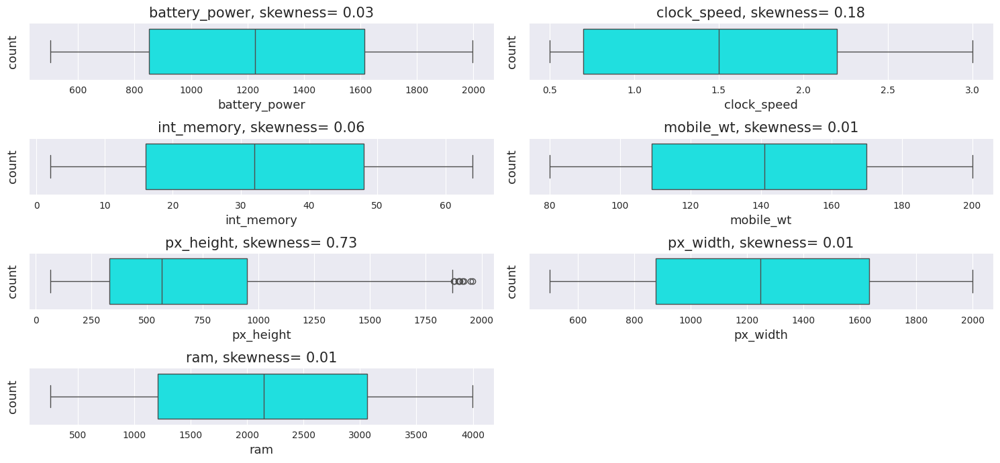

In [ ]:
# visualizing the numerical features through boxplot

plt.figure(figsize= (15, 7))
sns.set_style('darkgrid')
plotnumber=1

for column in continuous_features:
  if plotnumber <8:
    ax= plt.subplot(4, 2, plotnumber)
    sns.boxplot(data= data, x=column, color= 'cyan', orient='h')
    ax.set_title(f'{column}, skewness= {round(data[column].skew(),2)}', fontsize= 15)
    plt.xlabel(column, fontsize= 13)
    plt.ylabel('count', fontsize= 13)
  plotnumber+=1
plt.tight_layout()
plt.show()

In [ ]:
# From the boxplot, it is clear that the pixel height is showing some outliers.


In [ ]:
# Detecting outliers
# by IQR method

num_columns= data[['battery_power', 'clock_speed', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']]
q1= num_columns.quantile(0.25)
q3= num_columns.quantile(0.75)
iqr= q3 - q1

lower_limit= q1 - 1.5*iqr
upper_limit= q3 + 1.5*iqr

# Identifying outliers
outliers= ((num_columns < lower_limit)|(num_columns > upper_limit))

# total number of outliers for each variable
total_count_outliers= outliers.sum()

total_count_outliers.to_frame().T



,battery_power,clock_speed,int_memory,mobile_wt,px_height,px_width,ram
0,0,0,0,0,9,0,0


In [ ]:
# Cleaning outliers for 'px_height'

# skewed distribution so IQR METHOD
q1= data['px_height'].quantile(0.25)
q3= data['px_height'].quantile(0.75)
iqr= q3 -q1
lower_limit = q1- 1.5*iqr
upper_limit = q3+ 1.5*iqr
print('lower limit is', lower_limit)
print('upper limit is', upper_limit)

lower limit is -594.0
upper limit is 1872.0


In [ ]:
data.loc[data['px_height'] < lower_limit]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


In [ ]:
data.loc[data['px_height']> upper_limit]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
260,754,0,0.5,1,7,1,59,0.7,178,7,10,1914,1928,1027,6,3,5,1,0,0,1
894,1497,1,0.7,0,5,0,32,0.7,92,3,9,1920,1933,1329,6,5,7,1,1,0,2
988,1413,1,0.5,1,4,1,45,0.5,104,5,6,1949,1994,2973,17,8,15,1,0,1,3
1017,1221,0,0.5,0,1,1,28,0.5,139,1,7,1895,1976,2438,13,11,10,1,1,1,3
1163,1930,1,2.0,0,11,0,16,0.8,186,8,12,1901,1920,1783,17,3,13,0,0,1,2
1397,717,0,1.1,1,2,1,14,0.5,99,8,6,1878,1981,629,16,15,20,1,0,0,0
1615,1086,0,2.7,0,0,1,24,0.5,135,8,19,1874,1976,3930,17,5,18,1,1,1,3
1771,1230,1,1.6,0,0,1,48,0.7,111,7,2,1960,1963,1622,18,17,16,1,1,1,2
1827,1692,0,2.1,0,4,1,2,0.9,106,1,17,1899,1904,3779,9,3,7,1,1,1,3


In [ ]:
data.loc[data['px_height']> upper_limit, 'px_height'] = np.median(data['px_height'])

In [ ]:
# checking the outliers after handling them
data.loc[data['px_height'] < lower_limit] | data.loc[data['px_height'] > upper_limit]


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


In [ ]:
# hence outliers are handled.

### SCALING:

In [ ]:
data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.626000,140.249000,4.520500,9.916500,662.927000,1251.515500,2124.213000,12.306500,6.871000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.165159,35.399655,2.287837,6.064315,415.788306,432.199447,1084.732044,4.213245,3.380839,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.500000,80.000000,1.000000,0.000000,65.000000,500.000000,256.000000,5.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.500000,109.000000,3.000000,5.000000,330.750000,874.750000,1207.500000,9.000000,5.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,938.000000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1869.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
# for scaling purpose, new copy of data is created
data1= data.copy()
data1.head(2)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,564,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2


In [ ]:

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data1[['battery_power', 'clock_speed', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']] = scaler.fit_transform(data1[['battery_power', 'clock_speed', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']])

In [ ]:
data1.head() #data1 is the scaled data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,0.227789,0,0.68,0,1,0,0.080645,0.6,0.900000,2,2,0.276608,0.170895,0.612774,9,7,19,0,0,1,1
1,0.347361,1,0.00,1,0,1,0.822581,0.7,0.466667,3,6,0.465632,0.993324,0.634687,17,3,7,1,1,0,2
2,0.041416,1,0.00,1,2,1,0.629032,0.9,0.541667,5,6,0.664080,0.811749,0.627205,11,5,9,1,1,0,2
3,0.076152,1,0.80,0,0,0,0.129032,0.8,0.425000,6,9,0.638027,0.858478,0.671566,16,8,11,1,0,0,2
4,0.881764,1,0.28,0,13,1,0.677419,0.6,0.508333,2,14,0.633592,0.475300,0.308658,8,5,15,1,1,0,1


## FEATURES SELECTION:

### Correlation between EACH INDEPENDENT FEATURE and the TARGET VARIABLE

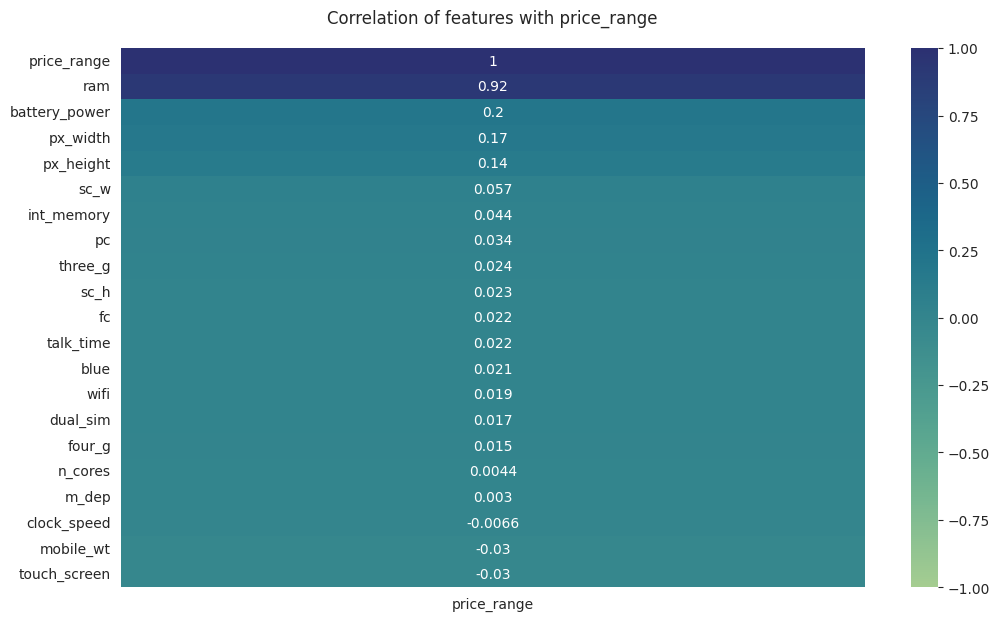

In [ ]:
plt.figure(figsize= (12, 7), dpi= 100) # taking scaled data 'data1'
heatmap= sns.heatmap(data1.corr()[['price_range']].sort_values(by= 'price_range', ascending= False),
                     vmin= -1, vmax = 1, annot= True, cmap= 'crest')

heatmap.set_title('Correlation of features with price_range', fontsize= 12, pad= 18)
plt.show()

##### Insights:
- It is clear that there exists a **positive correlation** between
<ul type= 'circle'>
<li>price range and ram
<li>price range and battery_power
<li>price range and px_width
<li>price range and px_height</li>
</ul>

- Most of the variables except **clock_speed**, **mobile_wt**,  and **touch_screen** are positively correlated with the target.



### Correlation between the INDEPENDENT FEATURES:

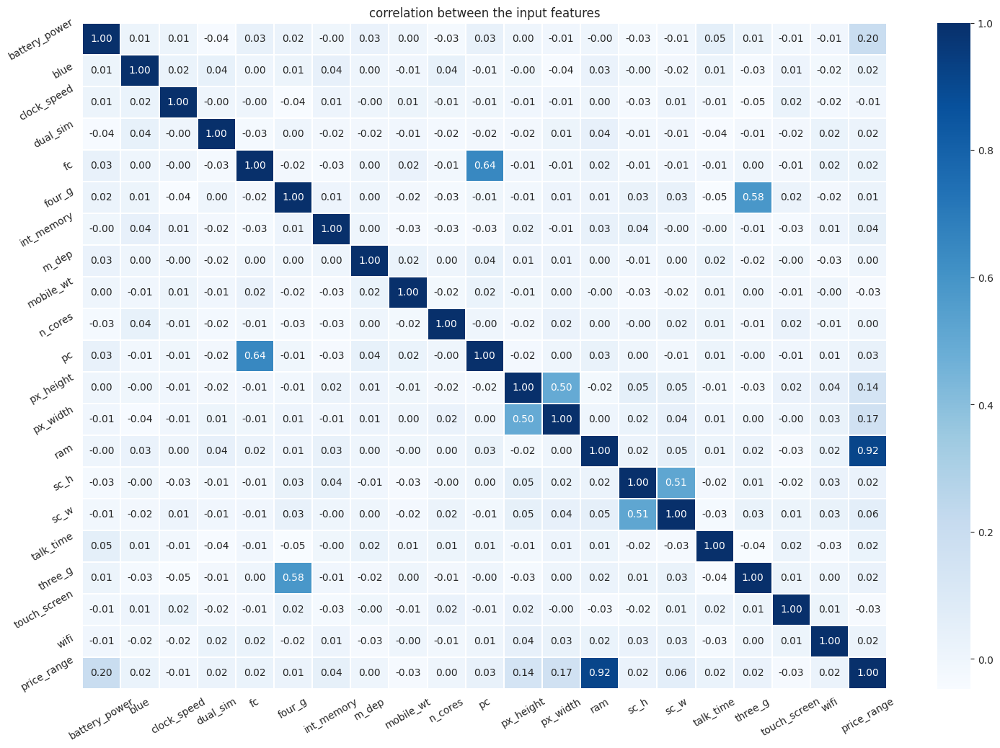

In [ ]:
fig= plt.gcf() # gets the current figure object
fig.set_size_inches(18, 12) # adjusts the dimension to ensure readability of the heatmap
plt.title('correlation between the input features')
h = sns.heatmap(data1.corr(), annot= True, cmap= 'Blues', fmt= '.2f', linewidths= 0.2)
h.set_xticklabels(h.get_xticklabels(), rotation= 30)
h.set_yticklabels(h.get_yticklabels(), rotation= 30)
plt.show()

##### Insights:
- There is a **strong correlation** between **ram and price_range**.
- Besides that, the above heatmap shows a **moderate correlation** between
<ul type= 'circle'>
<li>4G and 3G
<li>fc and pc
<li>px_height and px_width
<li>sc_h and sc_w.
</ul>


## MODEL BUILDING:

### DECISION TREE:

In [ ]:
# Splitting features and target variable

X= data1.drop('price_range', axis= 1)
y= data1[['price_range']]

In [ ]:
#Checking the shape of X and y

print(f'X: {X.shape}\ny: {y.shape}')

X: (2000, 20)
y: (2000, 1)


In [ ]:
# finding the best test size

# Array of test size values from 0.2 to 0.3
test_size= np.arange(start=0.2, stop= 0.35, step= 0.05)

#importing the required libraries for the model
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

#Initialising a list to store the score of each test size
score= []

for size in test_size:
  X_train1, X_test1, y_train1, y_test1= train_test_split(X, y, stratify = y, test_size= size, random_state=0)
  dt_clf= DecisionTreeClassifier()
  dt_clf.fit(X_train1, y_train1)
  score.append(dt_clf.score(X_test1, y_test1))

# Creating a dataframe to display the results
d= pd.DataFrame({'Test size': test_size, 'Score': score })
d.sort_values(by=['Score'], ascending = False, inplace = True)
d.style.highlight_max(color='lightcoral')


,Test size,Score
0,0.200000,0.842500
2,0.300000,0.815000
1,0.250000,0.804000


Hence the test size of **0.2** is the better one for **Decision Tree modeling**.

#### Train Test Split

In [ ]:
# Splitting x and y into training and testing sets
X_train1, X_test1, y_train1, y_test1= train_test_split(X, y, test_size= 0.2, random_state=0)

In [ ]:
# Checking the shape
print(f'X_train shape: {X_train1.shape}\nX_test shape: {X_test1.shape}')
print(f'y_train shape: {y_train1.shape}\ny_test shape: {y_test1.shape}')

X_train shape: (1600, 20)
X_test shape: (400, 20)
y_train shape: (1600, 1)
y_test shape: (400, 1)


#### Training the Decision tree model

In [ ]:
# Initializing the model
dt_model= DecisionTreeClassifier()

# fitting the model to the train data
dt_model.fit(X_train1, y_train1)

DecisionTreeClassifier()

#### Prediction

In [ ]:
y_pred= dt_model.predict(X_test1)

#### Model Evaluation:

In [ ]:
# Checking Accuracy score

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test1, y_pred)
print(f'Model accuracy score: {a}')

Model accuracy score: 0.84


In [ ]:
# Checking for overfitting and underfitting

Training_accuracy= dt_model.score(X_train1, y_train1)
Testing_accuracy= dt_model.score(X_test1, y_test1)
print(f'Training set score: {Training_accuracy}')
print(f'Testing set score: {Testing_accuracy}')


Training set score: 1.0
Testing set score: 0.84


The **training set accuracy** is **1.0** whereas the **testing set accuracy** is 0.84. Clearly the model is overfitted.

In [ ]:
# K-Fold Cross-validation

from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
kf= KFold(n_splits= 10, shuffle= False)

In [ ]:
# cross validation accuracy

score= cross_val_score(dt_model, X, y, cv= kf, scoring= 'accuracy')
print(f'Cross validation accuracy scores: {score}')

Cross validation accuracy scores: [0.79  0.92  0.895 0.79  0.855 0.845 0.845 0.86  0.83  0.83 ]


In [ ]:
DT_acc= pd.DataFrame({'CV mean': score.mean(), 'Std': score.std()}, index= ['Cross validation accuracy'])
DT_acc

,CV mean,Std
Cross validation accuracy,0.846,0.038652


- The **mean cross validation** of the model is 0.84 which shows that the model is expected to be around **84%** accurate on average.
- **10 fold cross validation** accuracy does not show any significant improvement in the model's performance.

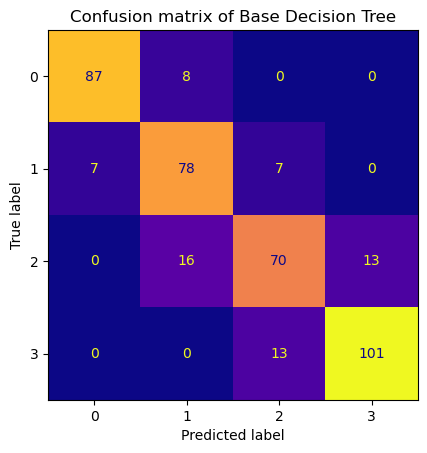

In [ ]:
# Confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(dt_model, X_test1, y_test1, colorbar= False, cmap= 'plasma')
plt.title('Confusion matrix of Base Decision Tree')
plt.grid(False)

In [ ]:
# classification report

print(classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.92      0.92        95
           1       0.76      0.85      0.80        92
           2       0.78      0.71      0.74        99
           3       0.89      0.89      0.89       114

    accuracy                           0.84       400
   macro avg       0.84      0.84      0.84       400
weighted avg       0.84      0.84      0.84       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result


In [ ]:
Base_dt_result= metrics_calculator(y_test1, y_pred, 'Base Decision Tree')
Base_dt_result

,Base Decision Tree
Accuracy,0.840000
precision,0.838495
Recall,0.839163
F1-score,0.837866


In [ ]:
# Plot tree

from sklearn import tree

fig= plt.figure(figsize= (150, 150))
plot= tree.plot_tree(dt_model, filled = True, fontsize= 8)

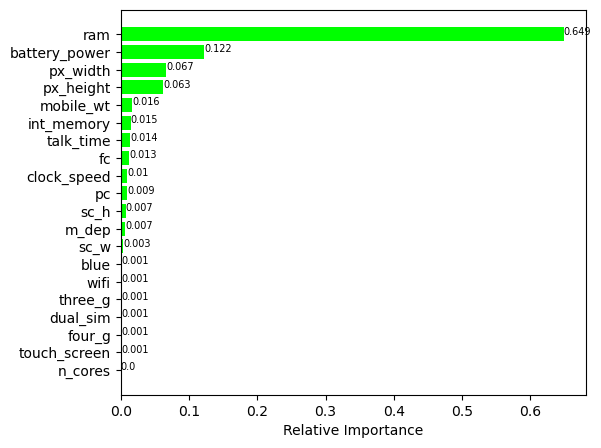

In [ ]:
# feature importance

#getting feature importances from the decision tree model
importances= dt_model.feature_importances_
feature_names= X.columns

# sort the features by importance
indices= np.argsort(importances)

# Create a horizontal bar plot of the feature importances
plt.figure(figsize= (6, 5))
plt.barh(range(len(indices)), importances[indices], color= 'lime', align= 'center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

# Add labels to the bars
for i, v in enumerate(importances[indices]):
  plt.text(v, i, str(round(v, 3)), color= 'black', fontsize= 7)

plt.show()

#### TUNING DECISION TREE HYPERPARAMETERS USING GRIDSEARCHCV

#### Finding optimal hyper parameters(GridSearchCV)

In [ ]:

# Defining model
model = DecisionTreeClassifier()

# Defining evaluation
from sklearn.model_selection import RepeatedStratifiedKFold
cv= RepeatedStratifiedKFold(n_splits=10, n_repeats= 3, random_state= 0)

# Defining search parameters
max_depth= range(2, 19, 1)
criterion= ['entropy', 'gini']
min_samples_split= [2, 3, 4]
min_samples_leaf= [1, 2, 3]

param_grid= {'max_depth': max_depth, 'criterion': criterion, 'min_samples_split': min_samples_split,
             'min_samples_leaf': min_samples_leaf}

# Defining search
from sklearn.model_selection import GridSearchCV
search= GridSearchCV(model, param_grid, scoring= 'accuracy', n_jobs= -1, cv= cv)

# Executing search
GridSearchCV = search.fit(X_train1, y_train1)

# Setting the classifier to the best combination of parameters
dt_model_cv= GridSearchCV.best_estimator_

# Summarizing the result
print('Best Score: ', GridSearchCV.best_score_)
print('Best hyperparameters: ', GridSearchCV.best_params_)


Best Score:  0.8527083333333333
Best hyperparameters:  {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 3, 'min_samples_split': 2}


#### Tuned Decision Tree Model

In [ ]:
# Training the tuned model

dt_model_cv.fit(X_train1, y_train1)

DecisionTreeClassifier(criterion='entropy', max_depth=16, min_samples_leaf=3)

#### Prediction

In [ ]:
y_pred= dt_model_cv.predict(X_test1)

#### Tuned model Evaluation

In [ ]:
# Accuracy score

print(f'Tuned DT model accuracy score:\n {accuracy_score(y_test1, y_pred)}')

Tuned DT model accuracy score:
 0.8525


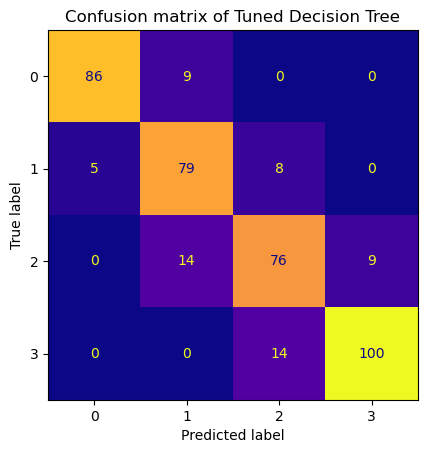

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(dt_model_cv, X_test1, y_test1, colorbar= False, cmap= 'plasma')
plt.title('Confusion matrix of Tuned Decision Tree')
plt.grid(False)


In [ ]:
# tuned model classification report

print(classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.91      0.92        95
           1       0.77      0.86      0.81        92
           2       0.78      0.77      0.77        99
           3       0.92      0.88      0.90       114

    accuracy                           0.85       400
   macro avg       0.85      0.85      0.85       400
weighted avg       0.86      0.85      0.85       400



In [ ]:
# tuned model performance metrics

tuned_dt_result= metrics_calculator(y_test1, y_pred, 'Tuned Decision Tree')
tuned_dt_result

,Tuned Decision Tree
Accuracy,0.852500
precision,0.853127
Recall,0.852207
F1-score,0.851900


In [ ]:
# plotting tree

fig= plt.figure(figsize= (150, 150))
plot= tree.plot_tree(dt_model_cv, filled = True, fontsize= 8)

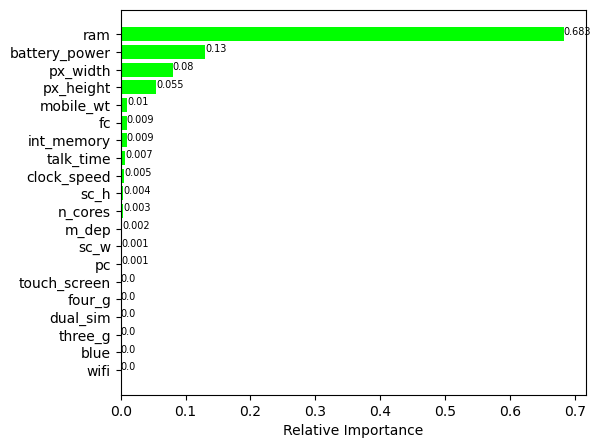

In [ ]:
# tuned model feature importance

#getting feature importances from the tuned decision tree model
importances= dt_model_cv.feature_importances_
feature_names= X.columns

# sort the features by importance
indices= np.argsort(importances)

# Creating a horizontal bar plot of the feature importances
plt.figure(figsize= (6, 5))
plt.barh(range(len(indices)), importances[indices], color= 'lime', align= 'center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

# Adding labels to the bars
for i, v in enumerate(importances[indices]):
  plt.text(v, i, str(round(v, 3)), color= 'black', fontsize= 7)

plt.show()

### RANDOM FOREST:

In [ ]:
# Splitting features and target variable

X= data1.drop('price_range', axis= 1)
y= data1[['price_range']]

In [ ]:
#Checking the shape of X and y

print(f'X: {X.shape}\ny: {y.shape}')

X: (2000, 20)
y: (2000, 1)


In [ ]:
# finding the best test size

# Array of test size values from 0.2 to 0.3
test_size= np.arange(start=0.2, stop= 0.35, step= 0.05)

#importing the required libraries for the model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

#Initialising a list to store the score of each test size
score= []

for size in test_size:
  X_train2, X_test2, y_train2, y_test2= train_test_split(X, y, test_size= size, random_state=0)
  rf_model= RandomForestClassifier()
  rf_model.fit(X_train2, y_train2)
  score.append(rf_model.score(X_test2, y_test2))

# Creating a dataframe to display the results
r= pd.DataFrame({'Test size': test_size, 'Score': score })
r.sort_values(by=['Score'], ascending = False, inplace = True)
r.style.highlight_max(color='limegreen')

,Test size,Score
1,0.250000,0.886000
2,0.300000,0.880000
0,0.200000,0.877500


Hence the test size of **0.25** is the better one for **Random Forest modeling**.

#### Train Test Split

In [ ]:
# Splitting x and y into training and testing sets
X_train2, X_test2, y_train2, y_test2= train_test_split(X, y, stratify=y, test_size= 0.25, random_state=0)

In [ ]:
# Checking the shape
print(f'X_train shape: {X_train2.shape}\nX_test shape: {X_test2.shape}')
print(f'y_train shape: {y_train2.shape}\ny_test shape: {y_test2.shape}')

X_train shape: (1500, 20)
X_test shape: (500, 20)
y_train shape: (1500, 1)
y_test shape: (500, 1)


#### Training the Random Forest model:

In [ ]:
# Initializing the model
rf_model= RandomForestClassifier()

# fitting the model to the train data
rf_model.fit(X_train2, y_train2)

RandomForestClassifier()

#### Prediction:

In [ ]:
y_pred= rf_model.predict(X_test2)

#### Model evaluation:

In [ ]:
# Checking Accuracy score

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test2, y_pred)
print(f'Model accuracy score: {a}')

Model accuracy score: 0.882


In [ ]:
# Checking for overfitting and underfitting

Training_accuracy= rf_model.score(X_train2, y_train2)
Testing_accuracy= rf_model.score(X_test2, y_test2)
print(f'Training set score: {Training_accuracy}')
print(f'Testing set score: {Testing_accuracy}')


Training set score: 1.0
Testing set score: 0.882


In [ ]:
# K-Fold Cross-validation

from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
kf= KFold(n_splits= 10, shuffle= False)

In [ ]:
# cross validation accuracy

score= cross_val_score(rf_model, X, y, cv= kf, scoring= 'accuracy')
print(f'Cross validation accuracy scores: {score}')

Cross validation accuracy scores: [0.89  0.865 0.925 0.87  0.915 0.875 0.895 0.865 0.855 0.855]


In [ ]:
RF_acc= pd.DataFrame({'CV mean': score.mean(), 'Std': score.std()}, index= ['Cross validation accuracy'])
RF_acc

,CV mean,Std
Cross validation accuracy,0.881,0.023216


- The **mean cross validation** of the model is 0.88 which shows that the model is expected to be around **88%** accurate on average.
- Hence it is evident that **10 fold cross validation** accuracy does not show any significant improvement in the model's performance.

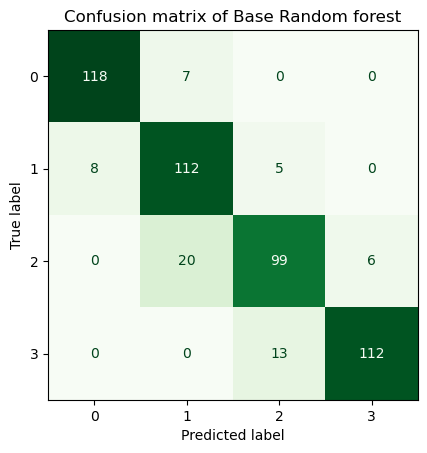

In [ ]:
# Confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(rf_model, X_test2, y_test2, colorbar= False, cmap= 'Greens')
plt.title('Confusion matrix of Base Random forest')
plt.grid(False)

In [ ]:
# classification report

print(classification_report(y_test2, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       125
           1       0.81      0.90      0.85       125
           2       0.85      0.79      0.82       125
           3       0.95      0.90      0.92       125

    accuracy                           0.88       500
   macro avg       0.88      0.88      0.88       500
weighted avg       0.88      0.88      0.88       500



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result

In [ ]:
Base_rf_result= metrics_calculator(y_test2, y_pred, 'Base random forest')
Base_rf_result

,Base random forest
Accuracy,0.882000
precision,0.884392
Recall,0.882000
F1-score,0.882179


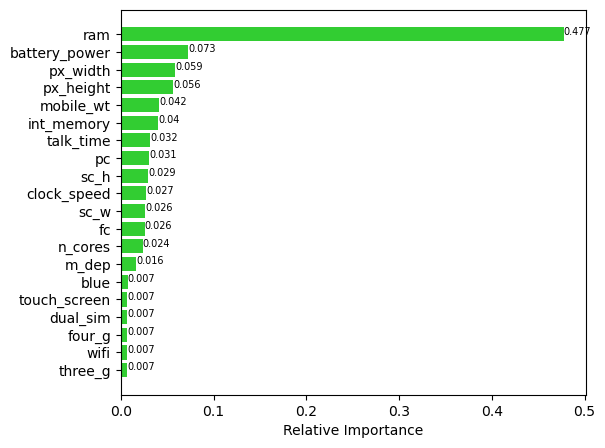

In [ ]:
# Random Forest feature importance

#getting feature importances from the random forest model
importances= rf_model.feature_importances_
feature_names= X.columns

# sort the features by importance
indices= np.argsort(importances)

# Create a horizontal bar plot of the feature importances
plt.figure(figsize= (6, 5))
plt.barh(range(len(indices)), importances[indices], color= 'limegreen', align= 'center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

# Add labels to the bars
for i, v in enumerate(importances[indices]):
  plt.text(v, i, str(round(v, 3)), color= 'black', fontsize= 7)

plt.show()

#### TUNING RANDOM FOREST HYPERPARAMETERS USING RANDOMIZEDSEARCHCV

#### Finding optimal hyper parameters(RandomizedSearchCV)

In [ ]:
# Importing the required libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Defining model
model = RandomForestClassifier()

# Defining evaluation
from sklearn.model_selection import RepeatedStratifiedKFold
cv= RepeatedStratifiedKFold(n_splits=10, n_repeats= 3, random_state= 0)

# Defining search parameters
n_estimators= [10, 50, 100, 200]
max_depth= [None, 3, 4, 8, 9, 10, 11, 12]
criterion= ['entropy', 'gini']
max_features= ['sqrt', 'log2']
min_samples_split= [2, 5, 10]
min_samples_leaf= [1, 2, 4]


param_grid= {'n_estimators': n_estimators, 'max_depth': max_depth, 'criterion': criterion,\
             'max_features': max_features, 'min_samples_split': min_samples_split,\
             'min_samples_leaf':min_samples_leaf}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
search= RandomizedSearchCV(model, param_grid, scoring= 'accuracy', n_jobs= -1, cv= cv)



In [ ]:
# Executing search
RandomizedSearchCV = search.fit(X_train2, y_train2)

# Setting the classifier to the best combination of parameters
rf_model_cv= RandomizedSearchCV.best_estimator_

# Summarizing the result
print('Best Score: ', RandomizedSearchCV.best_score_)
print('Best hyperparameters: ', RandomizedSearchCV.best_params_)

Best Score:  0.8724444444444447
Best hyperparameters:  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 12, 'criterion': 'entropy'}


#### Tuned Random forest Model

In [ ]:
# Training the tuned model

rf_model_cv.fit(X_train2, y_train2)

RandomForestClassifier(criterion='entropy', max_depth=12, max_features='log2',
                       min_samples_split=10)

#### Prediction

In [ ]:
y_pred= rf_model_cv.predict(X_test2)

#### tuned model evaluation

In [ ]:
# Accuracy score

print(f'Tuned RF model accuracy score:\n {accuracy_score(y_test2, y_pred)}')

Tuned RF model accuracy score:
 0.89


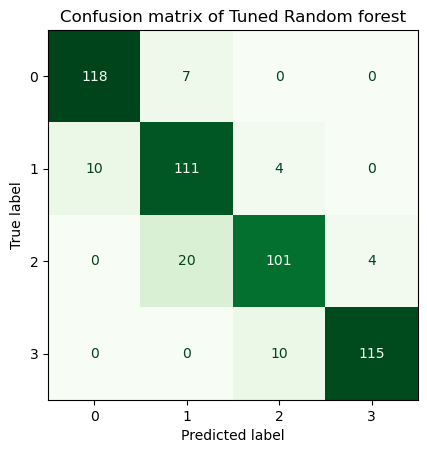

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(rf_model_cv, X_test2, y_test2, colorbar= False, cmap= 'Greens')
plt.title('Confusion matrix of Tuned Random forest')
plt.grid(False)

In [ ]:
# tuned model performance metrics

tuned_rf_result= metrics_calculator(y_test2, y_pred, 'Tuned Random Forest')
tuned_rf_result

,Tuned Random Forest
Accuracy,0.890000
precision,0.892718
Recall,0.890000
F1-score,0.890301


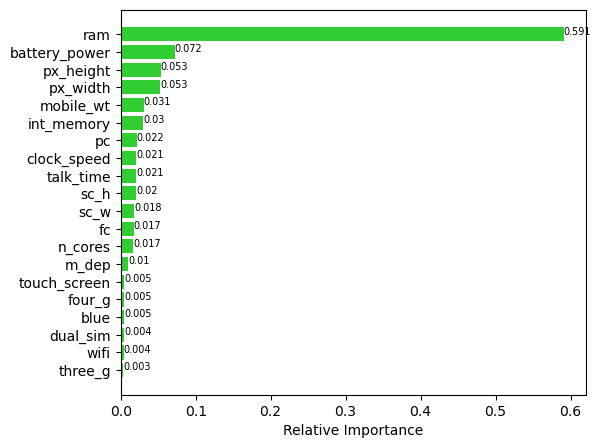

In [ ]:
# tuned model feature importance

#getting feature importances from the tuned random forest model
importances= rf_model_cv.feature_importances_
feature_names= X.columns

# sort the features by importance
indices= np.argsort(importances)

# Creating a horizontal bar plot of the feature importances
plt.figure(figsize= (6, 5))
plt.barh(range(len(indices)), importances[indices], color= 'limegreen', align= 'center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')

# Adding labels to the bars
for i, v in enumerate(importances[indices]):
  plt.text(v, i, str(round(v, 3)), color= 'black', fontsize= 7)

plt.show()

### SUPPORT VECTOR MACHINE:

In [ ]:
# Splitting features and target variable

X= data1.drop('price_range', axis= 1)
y= data1[['price_range']]

In [ ]:
#Checking the shape of X and y

print(f'X: {X.shape}\ny: {y.shape}')

X: (2000, 20)
y: (2000, 1)


In [ ]:
# finding the best test size

# Array of test size values from 0.2 to 0.3
test_size= np.arange(start=0.2, stop= 0.35, step= 0.05)

#importing the required libraries for the model
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

#Initialising a list to store the score of each test size
score= []

for size in test_size:
  X_train3, X_test3, y_train3, y_test3= train_test_split(X, y, test_size= size, random_state=0)
  svm_model= SVC()
  svm_model.fit(X_train3, y_train3)
  score.append(svm_model.score(X_test3, y_test3))

# Creating a dataframe to display the results
s= pd.DataFrame({'Test size': test_size, 'Score': score })
s.sort_values(by=['Score'], ascending = False, inplace = True)
s.style.highlight_max(color='hotpink')

,Test size,Score
0,0.200000,0.330000
1,0.250000,0.326000
2,0.300000,0.325000


#### train test split

In [ ]:
# splitting the x and y into train and test data

X_train3, X_test3, y_train3, y_test3= train_test_split(X, y, stratify= y, test_size= 0.2, random_state= 0)


In [ ]:
# Checking the shape

print(f'X_train shape: {X_train3.shape}\nX_test shape: {X_test3.shape}')
print(f'y_train shape: {y_train3.shape}\ny_test shape: {y_test3.shape}')

X_train shape: (1600, 20)
X_test shape: (400, 20)
y_train shape: (1600, 1)
y_test shape: (400, 1)


#### Training the svm model:

In [ ]:
# Initiating the model

svm_model= SVC(probability = True)

# fitting the model to the training set
svm_model.fit(X_train3, y_train3)

SVC(probability=True)

#### Prediction

In [ ]:
y_pred= svm_model.predict(X_test3)

#### Model evaluation

In [ ]:
# Checking accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
print(f"Model accuracy score: {accuracy_score(y_test3, y_pred)}")

Model accuracy score: 0.3225


The score is very less.


#### Training the svm model using scaled data of StandardScaler

In [ ]:
# Let's try standard scaler since the accuracy is very low using minmaxscaler

data1.head() # data1 is the scaled data using minmax scaler
# hence standard scaler is done on 'data'

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,0.227789,0,0.68,0,1,0,0.080645,0.6,0.900000,2,2,0.276608,0.170895,0.612774,9,7,19,0,0,1,1
1,0.347361,1,0.00,1,0,1,0.822581,0.7,0.466667,3,6,0.465632,0.993324,0.634687,17,3,7,1,1,0,2
2,0.041416,1,0.00,1,2,1,0.629032,0.9,0.541667,5,6,0.664080,0.811749,0.627205,11,5,9,1,1,0,2
3,0.076152,1,0.80,0,0,0,0.129032,0.8,0.425000,6,9,0.638027,0.858478,0.671566,16,8,11,1,0,0,2
4,0.881764,1,0.28,0,13,1,0.677419,0.6,0.508333,2,14,0.633592,0.475300,0.308658,8,5,15,1,1,0,1


In [ ]:
data2= data.copy()
data2.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,564,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,5,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,5,15,1,1,0,1


In [ ]:
X= data2.drop('price_range', axis= 1)
y= data2[['price_range']]

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data2[['battery_power', 'clock_speed', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']] = scaler.fit_transform(data2[['battery_power', 'clock_speed', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']])

In [ ]:
data2.head() # hence scaled.

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,-0.902597,0,0.830779,0,1,0,-1.380644,0.6,1.349249,2,2,-0.237986,-1.146784,0.391703,9,7,19,0,0,1,1
1,-0.495139,1,-1.253064,1,0,1,1.155024,0.7,-0.120059,3,6,0.582348,1.704465,0.467317,17,3,7,1,1,0,2
2,-1.537686,1,-1.253064,1,2,1,0.493546,0.9,0.134244,5,6,1.443579,1.074968,0.441498,11,5,9,1,1,0,2
3,-1.419319,1,1.198517,0,0,0,-1.215274,0.8,-0.261339,6,9,1.330512,1.236971,0.594569,16,8,11,1,0,0,2
4,1.325906,1,-0.395011,0,13,1,0.658915,0.6,0.021220,2,14,1.311267,-0.091452,-0.657666,8,5,15,1,1,0,1


In [ ]:
# training the model

#train test split
X_train3, X_test3, y_train3, y_test3= train_test_split(X, y, stratify= y, test_size= 0.2, random_state= 0)


In [ ]:
# Initiating the model

svm_model= SVC(probability= True)

# fitting the model to the training set
svm_model.fit(X_train3, y_train3)

SVC(probability=True)

In [ ]:
# prediction

y_pred= svm_model.predict(X_test3)

In [ ]:
# checking accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test3, y_pred)
print(f'Model accuracy score: {a}')


Model accuracy score: 0.9525


In [ ]:
# Checking for overfitting and underfitting

Training_accuracy= svm_model.score(X_train3, y_train3)
Testing_accuracy= svm_model.score(X_test3, y_test3)
print(f'Training set score: {Training_accuracy}')
print(f'Testing set score: {Testing_accuracy}')

Training set score: 0.94625
Testing set score: 0.9525


#### Insights:
- The **training set** accuracy score is **0.946** while the **testing set** accuracy score is found to be **0.9525**. These two values are quite comparable. So there is no question of overfitting.

In [ ]:
# K-Fold Cross-validation

from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
kf= KFold(n_splits= 10, shuffle= False)

In [ ]:
# cross validation accuracy

score= cross_val_score(svm_model, X, y, cv= kf, scoring= 'accuracy')
print(f'Cross validation accuracy scores: {score}')

Cross validation accuracy scores: [0.955 0.955 0.92  0.95  0.935 0.965 0.935 0.945 0.915 0.945]


In [ ]:
SVM_acc= pd.DataFrame({'CV mean': score.mean(), 'Std': score.std()}, index= ['Cross validation accuracy'])
SVM_acc

,CV mean,Std
Cross validation accuracy,0.942,0.015033


#### Interpretation:
- The **mean cross validation** of the model is 0.942 which shows that the model is expected to be around **94.2%** accurate on average.
- Hence it is evident that **10 fold cross validation** accuracy does not show any significant improvement in the model's performance.

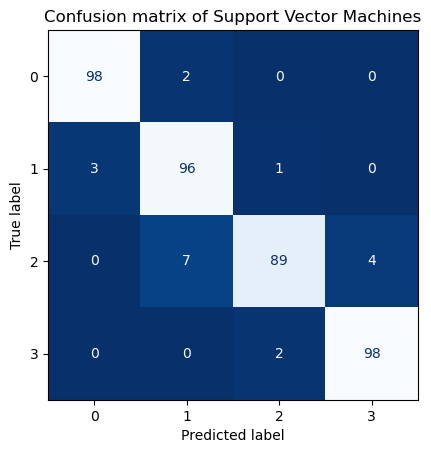

In [ ]:
# Confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(svm_model, X_test3, y_test3, colorbar= False, cmap= 'Blues_r')
plt.title('Confusion matrix of Support Vector Machines')
plt.grid(False)

In [ ]:
# classification report

print(classification_report(y_test3, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       100
           1       0.91      0.96      0.94       100
           2       0.97      0.89      0.93       100
           3       0.96      0.98      0.97       100

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result

In [ ]:
Base_svm_result= metrics_calculator(y_test3, y_pred, 'Base SVM')
Base_svm_result

,Base SVM
Accuracy,0.952500
precision,0.953190
Recall,0.952500
F1-score,0.952273


#### TUNING SVM HYPERPARAMETERS USING RANDOMIZEDSEARCHCV

#### Finding optimal hyper parameters(RandomizedSearchCV)

In [ ]:
# Importing the required libraries
from sklearn.svm import SVC
from scipy.stats import uniform

# Defining model
model = SVC()

# Defining search parameters
C= uniform(0.1, 10)
kernel= ['linear', 'rbf']
gamma= ['scale', 'auto']

param_grid= {'C': C, 'kernel': kernel, 'gamma': gamma}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
search= RandomizedSearchCV(model, param_grid, scoring= 'accuracy', n_jobs= -1, cv= 5, n_iter=10)


In [ ]:
# Executing search
RandomizedSearchCV = search.fit(X_train3, y_train3)

# Setting the classifier to the best combination of parameters
svm_model_cv= RandomizedSearchCV.best_estimator_

# Summarizing the result
print('Best Score: ', RandomizedSearchCV.best_score_)
print('Best hyperparameters: ', RandomizedSearchCV.best_params_)

Best Score:  0.9512500000000002
Best hyperparameters:  {'C': 7.765356365907372, 'gamma': 'scale', 'kernel': 'linear'}


#### Tuned SVM Model

In [ ]:
# Training the tuned model
svm_model_cv.fit(X_train3, y_train3)

SVC(C=7.765356365907372, kernel='linear')

#### Prediction

In [ ]:
y_pred= svm_model_cv.predict(X_test3)

#### Tuned model evaluation

In [ ]:
# Accuracy score

print(f'Tuned SVM model accuracy score:\n {accuracy_score(y_test3, y_pred)}')

Tuned SVM model accuracy score:
 0.9525


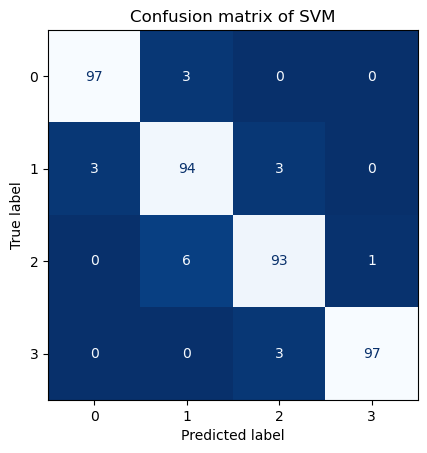

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(svm_model_cv, X_test3, y_test3, colorbar= False, cmap= 'Blues_r')
plt.title('Confusion matrix of SVM')
plt.grid(False)

In [ ]:
# tuned model classification report

print(classification_report(y_test3, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       100
           1       0.91      0.94      0.93       100
           2       0.94      0.93      0.93       100
           3       0.99      0.97      0.98       100

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



In [ ]:
# tuned model performance metrics

tuned_svm_result= metrics_calculator(y_test3, y_pred, 'Tuned SVM')
tuned_svm_result

,Tuned SVM
Accuracy,0.952500
precision,0.952953
Recall,0.952500
F1-score,0.952645


### BAGGING:

In [ ]:
# Splitting the data # data2 is the scaled data(Minmax scaler)
X= data1.drop('price_range', axis= 1)
y= data1[['price_range']]

In [ ]:
#Checking the shape of X and y

print(f'X: {X.shape}\ny: {y.shape}')

X: (2000, 20)
y: (2000, 1)


In [ ]:
# Splitting x and y into training and testing sets

from sklearn.model_selection import train_test_split

X_train4, X_test4, y_train4, y_test4= train_test_split(X, y, test_size= 0.2, random_state=0)

In [ ]:
# Checking the shape
print(f'X_train shape: {X_train4.shape}\nX_test shape: {X_test4.shape}')
print(f'y_train shape: {y_train4.shape}\ny_test shape: {y_test4.shape}')

X_train shape: (1600, 20)
X_test shape: (400, 20)
y_train shape: (1600, 1)
y_test shape: (400, 1)


#### Training the tuned bagged decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier

# Defining the base model and the bagging model
base_model = DecisionTreeClassifier()
bagging_model= BaggingClassifier(base_estimator= base_model, random_state= 0)


# Defining a dictionary of hyperparameters to search over
param_grid= {'base_estimator__max_depth': [4, 6],
             'base_estimator__min_samples_split': [4, 6],
             'n_estimators': [50, 100],
             'max_samples': [0.7, 1.0]}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
ramdomized_search= RandomizedSearchCV(bagging_model, param_grid, scoring= 'accuracy', n_jobs= -1, cv= 5)

# fit the Ramdomizedsearch on the data
ramdomized_search.fit(X_train4, y_train4)

# Setting the classifier to the best combination of parameters
Bagging= ramdomized_search.best_estimator_

# Summarizing the result
print('Best hyperparameters:', ramdomized_search.best_params_)

Best hyperparameters: {'n_estimators': 50, 'max_samples': 1.0, 'base_estimator__min_samples_split': 4, 'base_estimator__max_depth': 6}


#### Training tuned model

In [ ]:
# fit the bagging model on the training set
Bagging.fit(X_train4, y_train4)

# prediction
y_pred= Bagging.predict(X_test4)


#### Model evaluation

In [ ]:
# evaluation

#accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test4, y_pred)
print(f'Accuracy score of the bagged decision tree model: {a}')

Accuracy score of the bagged decision tree model: 0.87


In [ ]:
# cross validated score

from sklearn.model_selection import cross_val_score
cross_val_scores= cross_val_score(Bagging, X_train4, y_train4, cv= 10, scoring= 'accuracy')

print('Cross-validated score of the Bagged Decision Tree Model:', cross_val_scores.mean())

Cross-validated score of the Bagged Decision Tree Model: 0.871875


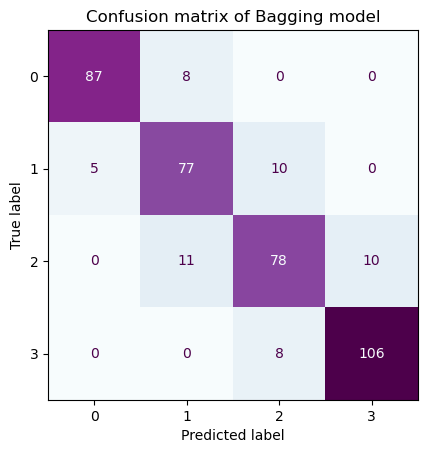

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(Bagging, X_test4, y_test4, colorbar= False, cmap= 'BuPu')
plt.title('Confusion matrix of Bagging model')
plt.grid(False)

In [ ]:
# tuned model classification report

print(classification_report(y_test4, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93        95
           1       0.80      0.84      0.82        92
           2       0.81      0.79      0.80        99
           3       0.91      0.93      0.92       114

    accuracy                           0.87       400
   macro avg       0.87      0.87      0.87       400
weighted avg       0.87      0.87      0.87       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result


In [ ]:
Bagged_decisiontree_result= metrics_calculator(y_test4, y_pred, 'Tuned Bagged Decision Tree')
Bagged_decisiontree_result

,Tuned Bagged Decision Tree
Accuracy,0.870000
precision,0.868507
Recall,0.867612
F1-score,0.867842


### BOOSTING (AdaBoost, Gradient Boosting and XGBoost)

#### 1. AdaBoost

#### Tuned AdaBoost (Adaptive Boosting)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xg

# Defining the adaboost model with default hyperparameters

ada= AdaBoostClassifier(base_estimator= DecisionTreeClassifier(), random_state= 0)


# Defining a dictionary of hyperparameters to tune
param_grid= {'n_estimators': [50, 100, 200],
             'learning_rate': [0.1, 0.01, 1],
             'base_estimator__max_depth':[1, 2, 3, 4, 5]}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
randomized_search= RandomizedSearchCV(estimator= ada, param_distributions=param_grid, scoring= 'accuracy', n_jobs= -1, cv= 10)

# fit the gridsearch on the data
randomized_search.fit(X_train4, y_train4)

# Setting the classifier to the best combination of parameters
AdaBoost= randomized_search.best_estimator_

# Summarizing the result
print('Best hyperparameters:', randomized_search.best_params_)

Best hyperparameters: {'n_estimators': 200, 'learning_rate': 1, 'base_estimator__max_depth': 4}


#### Train tuned model

In [ ]:
# fit the adaboost model on the training set
AdaBoost.fit(X_train4, y_train4)

# prediction
y_pred= AdaBoost.predict(X_test4)

#### Model evaluation

In [ ]:
# evaluation

#accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test4, y_pred)
print(f'Accuracy score of the adaboost model: {a}')

Accuracy score of the adaboost model: 0.9125


In [ ]:
# cross validated score

from sklearn.model_selection import cross_val_score
cross_val_scores= cross_val_score(AdaBoost, X_train4, y_train4, cv= 10, scoring= 'accuracy')

print('Cross-validated score of the adaboost Model:', cross_val_scores.mean())

Cross-validated score of the adaboost Model: 0.89125


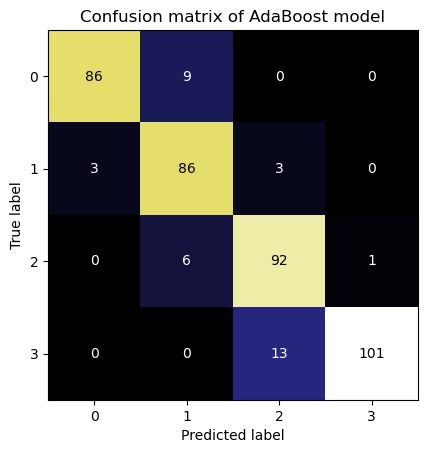

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(AdaBoost, X_test4, y_test4, colorbar= False, cmap= 'CMRmap')
plt.title('Confusion matrix of AdaBoost model')
plt.grid(False)

In [ ]:
# tuned model classification report

print(classification_report(y_test4, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.91      0.93        95
           1       0.85      0.93      0.89        92
           2       0.85      0.93      0.89        99
           3       0.99      0.89      0.94       114

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.92      0.91      0.91       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):
    result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
    return result

In [ ]:
AdaBoost_result= metrics_calculator(y_test4, y_pred, 'Tuned AdaBoost')
AdaBoost_result

,Tuned AdaBoost
Accuracy,0.912500
precision,0.914956
Recall,0.913826
F1-score,0.912512


#### 2. Gradient Boosting

#### Tuned gradient Boosting

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xg

# Defining the gradient boosting model with default hyperparameters

grad= GradientBoostingClassifier(learning_rate= 0.1, random_state= 0)


# Defining a dictionary of hyperparameters to tune
parameters= {'n_estimators': [50, 100],
             'max_depth': [5, 7],
             'learning_rate': [0.01, 0.1],
             'min_samples_split': [2, 5, 10],
             'min_samples_leaf': [1, 2, 4]}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
randomized_search= RandomizedSearchCV(grad, parameters, scoring= 'accuracy', n_jobs= -1, cv= 10)

# fit the gridsearch on the data
randomized_search.fit(X_train4, y_train4)

# Setting the classifier to the best combination of parameters
Gradient_Boosting= randomized_search.best_estimator_

# Summarizing the result
print('Best hyperparameters:', randomized_search.best_params_)

Best hyperparameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 5, 'learning_rate': 0.1}


#### Train tuned model

In [ ]:
# fit the gradient boosting model on the training set
Gradient_Boosting.fit(X_train4, y_train4)

# prediction
y_pred= Gradient_Boosting.predict(X_test4)

#### Model evaluation:

In [ ]:
# evaluation

#accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test4, y_pred)
print(f'Accuracy score of the gradient boost model: {a}')

Accuracy score of the gradient boost model: 0.92


In [ ]:
# cross validated score

from sklearn.model_selection import cross_val_score
cross_val_scores= cross_val_score(Gradient_Boosting, X_train4, y_train4, cv= 10, scoring= 'accuracy')

print('Cross-validated score of the gradient boosting Model:', cross_val_scores.mean())

Cross-validated score of the gradient boosting Model: 0.89375


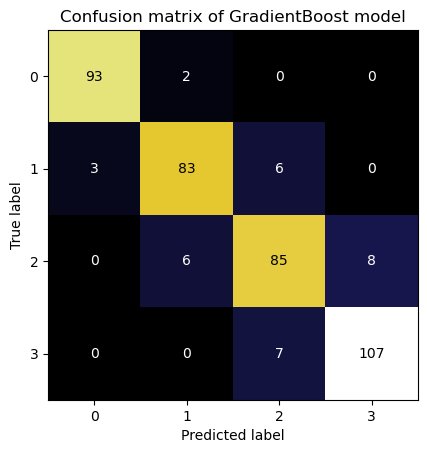

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(Gradient_Boosting, X_test4, y_test4, colorbar= False, cmap= 'CMRmap')
plt.title('Confusion matrix of GradientBoost model')
plt.grid(False)

In [ ]:
# tuned model classification report

print(classification_report(y_test4, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97        95
           1       0.91      0.90      0.91        92
           2       0.87      0.86      0.86        99
           3       0.93      0.94      0.93       114

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result

In [ ]:
GradientBoosting_result= metrics_calculator(y_test4, y_pred, 'Tuned gradient boosting')
GradientBoosting_result

,Tuned gradient boosting
Accuracy,0.920000
precision,0.919655
Recall,0.919576
F1-score,0.919592


#### 3. XG Boost

#### tuned XG Boost

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xg

# creating xgboost classfier

xgboost= xg.XGBClassifier(objective= 'multi:softmax', learning_rate= 0.1)


# Defining a dictionary of hyperparameters to tune
param_grid= {'n_estimators': [50, 100],
             'max_depth': [5, 7],
             'learning_rate': [0.01, 0.1],
             'subsample': [0.6, 0.8, 1],
             'colsample_bytree': [0.6, 0.8, 1.0],
             'gamma': [0, 1, 5]}

# Defining search
from sklearn.model_selection import RandomizedSearchCV
randomized_search= RandomizedSearchCV(estimator= xgboost, param_distributions= param_grid, scoring= 'accuracy', n_jobs= -1, cv= 10)

# fit the gridsearch on the data
randomized_search.fit(X_train4, y_train4)

# Setting the classifier to the best combination of parameters
xg_boost= randomized_search.best_estimator_

# Summarizing the result
print('Best hyperparameters:', randomized_search.best_params_)

Best hyperparameters: {'subsample': 0.6, 'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 1.0}


#### Train tuned model

In [ ]:
# fit the gradient boosting model on the training set
xg_boost.fit(X_train4, y_train4)

# prediction
y_pred= xg_boost.predict(X_test4)

#### model evaluation

In [ ]:
# evaluation

#accuracy score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
a= accuracy_score(y_test4, y_pred)
print(f'Accuracy score of the XG boost model: {a}')

Accuracy score of the XG boost model: 0.9125


In [ ]:
# cross validated score

from sklearn.model_selection import cross_val_score
cross_val_scores= cross_val_score(xg_boost, X_train4, y_train4, cv= 10, scoring= 'accuracy')

print('Cross-validated score of the XG Boost Model:', cross_val_scores.mean())

Cross-validated score of the XG Boost Model: 0.896875


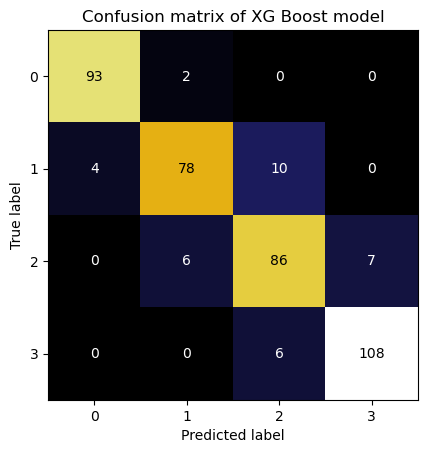

In [ ]:
# Tuned model confusion matrix

ConfusionMatrixDisplay.from_estimator(xg_boost, X_test4, y_test4, colorbar= False, cmap= 'CMRmap')
plt.title('Confusion matrix of XG Boost model')
plt.grid(False)

In [ ]:
# tuned model classification report

print(classification_report(y_test4, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97        95
           1       0.91      0.85      0.88        92
           2       0.84      0.87      0.86        99
           3       0.94      0.95      0.94       114

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.91       400



In [ ]:
# Performance metrics

'''Defining a function to calculate all the required performance metrics
for the given model'''
def metrics_calculator(y_test, y_pred, model_name):


  result= pd.DataFrame(data= [accuracy_score(y_test, y_pred),
                              precision_score(y_test, y_pred, average= 'macro'),
                              recall_score(y_test, y_pred, average= 'macro'),
                              f1_score(y_test, y_pred, average= 'macro')],
                       index=['Accuracy','precision','Recall', 'F1-score'],
                       columns= [model_name])
  return result

In [ ]:
xg_boost_result= metrics_calculator(y_test4, y_pred, 'Tuned XGBoost')
xg_boost_result

,Tuned XGBoost
Accuracy,0.912500
precision,0.912002
Recall,0.910707
F1-score,0.911027


## MODEL COMPARISON REPORT:

### Test size used for each of the  models

In [ ]:
Test_size_all= pd.DataFrame({'Base Decision Tree': 0.2, 'Tuned Decision Tree': 0.2,
                             'Base Random Forest': 0.25, 'Tuned Random Forest': 0.25,
                             'Base SVM': 0.2, 'Tuned SVM': 0.2,
                             'Tuned Bagged Decision Tree': 0.2,
                             'Tuned AdaBoost': 0.2, 'Tuned Gradient Boosting': 0.2, 'Tuned XGBoost': 0.2},
                             index= ['Test Size'])
Test_size_all.style.background_gradient(cmap='Purples')


,Base Decision Tree,Tuned Decision Tree,Base Random Forest,Tuned Random Forest,Base SVM,Tuned SVM,Tuned Bagged Decision Tree,Tuned AdaBoost,Tuned Gradient Boosting,Tuned XGBoost
Test Size,0.200000,0.200000,0.250000,0.250000,0.200000,0.200000,0.200000,0.200000,0.200000,0.200000


### Comparison of performance metrics of all the models

In [ ]:
Conclusion= pd.concat([Base_dt_result, tuned_dt_result, Base_rf_result, tuned_rf_result,
                      Base_svm_result, tuned_svm_result, Bagged_decisiontree_result,
                      AdaBoost_result, GradientBoosting_result, xg_boost_result], axis= 1)
Conclusion.style.background_gradient(cmap='Purples_r')

,Base Decision Tree,Tuned Decision Tree,Base random forest,Tuned Random Forest,Base SVM,Tuned SVM,Tuned Bagged Decision Tree,Tuned AdaBoost,Tuned gradient boosting,Tuned XGBoost
Accuracy,0.840000,0.852500,0.882000,0.890000,0.952500,0.952500,0.870000,0.912500,0.920000,0.912500
precision,0.838495,0.853127,0.884392,0.892718,0.953190,0.952953,0.868507,0.914956,0.919655,0.912002
Recall,0.839163,0.852207,0.882000,0.890000,0.952500,0.952500,0.867612,0.913826,0.919576,0.910707
F1-score,0.837866,0.851900,0.882179,0.890301,0.952273,0.952645,0.867842,0.912512,0.919592,0.911027


- 🔍Best **Accuracy**   ➡️ **Tuned SVM**
- 🔍Best **Precision**  ➡️ **Base SVM**
- 🔍Best **Recall**     ➡️ **Tuned SVM**
- 🔍Best **F1-score**   ➡️ **Tuned SVM**

### Comparison of Confusion Matrix of all the models

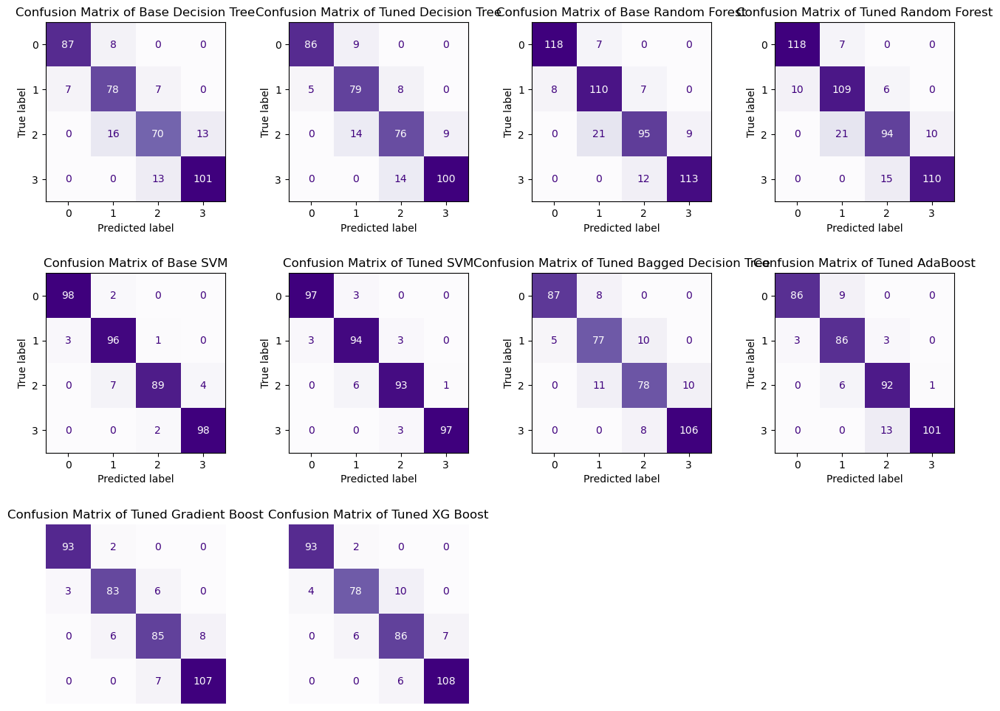

In [ ]:
# Creating subplots with 3 rows and 4 columns

# Defining models and data
models = [dt_model, dt_model_cv, rf_model, rf_model_cv, svm_model, svm_model_cv, Bagging, AdaBoost, Gradient_Boosting, xg_boost]
test_data = [(X_test1, y_test1), (X_test1, y_test1), (X_test2, y_test2), (X_test2, y_test2),
             (X_test3, y_test3), (X_test3, y_test3), (X_test4, y_test4), (X_test4, y_test4),
             (X_test4, y_test4), (X_test4, y_test4)]
titles = ['Confusion Matrix of Base Decision Tree', 'Confusion Matrix of Tuned Decision Tree',
          'Confusion Matrix of Base Random Forest', 'Confusion Matrix of Tuned Random Forest',
          'Confusion Matrix of Base SVM', 'Confusion Matrix of Tuned SVM',
          'Confusion Matrix of Tuned Bagged Decision Tree', 'Confusion Matrix of Tuned AdaBoost',
          'Confusion Matrix of Tuned Gradient Boost', 'Confusion Matrix of Tuned XG Boost']

# Creating subplots with 3 rows and 4 columns
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 12))

# Flatten axes to iterate over it
axes = axes.flatten()

# Plotting confusion matrices
for i, (model, (X_test, y_test), title) in enumerate(zip(models, test_data, titles)):
    row = i // 4
    col = i % 4
    ax = axes[i]
    display = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, colorbar=False, cmap='Purples', ax=ax)
    display.ax_.set_title(title)
    display.ax_.grid(False)

# Hide the last subplot
for ax in axes[8:]:
    ax.axis('off')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.3)

plt.show()


##### 🔍Correct predictions of **Label 0**⬇️
- Base Random forest > Tuned Random Forest > Base SVM > Tuned SVM > Tuned Gradient Boost> Tuned XG Boost> Base Decision Tree> Tuned Bagged Decision Tree> Tuned Decision tree> Tuned AdaBoost

##### 🔍Correct predictions of **Label 1**⬇️
- Base Random forest > Tuned Random Forest > Base SVM > Tuned SVM > Tuned Ada Boost> Tuned Gradient Boost> Tuned Decision Tree> Base Decision Tree> Tuned XG Boost> Tuned Bagged Decision Tree

##### 🔍Correct predictions of **Label 2**⬇️
- Base Random forest > Tuned Random Forest> Tuned SVM > Tuned Ada Boost > Base SVM> Tuned XG Boost> Tuned Gradient Boost> Tune Bagged Decision Tree> Tuned decision tree> Base Decision Tree

##### 🔍Correct predictions of **Label 3**⬇️
- Base Random forest > Tuned Random Fores > Tuned XG Boost> Tuned Gradient Boost> Tuned Bagged Decision tree> Base Decision tree> Tuned AdaBoost> Tuned Decision tree> Base SVM> Tuned SVM

### The order of the ✅Best Models from top to bottom:

In [ ]:
best_model= pd.DataFrame(['Tuned SVM ✅', 'Base SVM', 'Tuned Gradient Boosting',
                         'Tuned AdaBoost', 'Tuned XG Boost', 'Base Random Forest',
                         'Tuned Bagged Decision Tree', 'Tuned Random Forest',
                         'Tuned Decision Tree', 'Base Decision Tree'],
                         columns= ['Model (Best from 1 to 10)'],
                        index= [1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
best_model

,Model (Best from 1 to 10)
1,Tuned SVM ✅
2,Base SVM
3,Tuned Gradient Boosting
4,Tuned AdaBoost
5,Tuned XG Boost
6,Base Random Forest
7,Tuned Bagged Decision Tree
8,Tuned Random Forest
9,Tuned Decision Tree
10,Base Decision Tree


##### Insights:
- **Tuned SVM model** shows the **highest accuracy**.

## PREDICTION OF PRICE RANGE ( based on mobile specifications):

In [ ]:
# scaled data (standard Scaler) for fitting the best model- Tuned SVM

data2.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,-0.902597,0,0.830779,0,1,0,-1.380644,0.6,1.349249,2,2,-0.237986,-1.146784,0.391703,9,7,19,0,0,1,1
1,-0.495139,1,-1.253064,1,0,1,1.155024,0.7,-0.120059,3,6,0.582348,1.704465,0.467317,17,3,7,1,1,0,2
2,-1.537686,1,-1.253064,1,2,1,0.493546,0.9,0.134244,5,6,1.443579,1.074968,0.441498,11,5,9,1,1,0,2
3,-1.419319,1,1.198517,0,0,0,-1.215274,0.8,-0.261339,6,9,1.330512,1.236971,0.594569,16,8,11,1,0,0,2
4,1.325906,1,-0.395011,0,13,1,0.658915,0.6,0.021220,2,14,1.311267,-0.091452,-0.657666,8,5,15,1,1,0,1


In [ ]:
print(f'X_test shape: {X_test3.shape}\ny_test shape: {y_test3.shape}')

X_test shape: (400, 20)
y_test shape: (400, 1)


In [ ]:
test_sample= X_test3.copy()
test_sample.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
390,1836,1,1.7,1,3,0,26,0.5,134,6,16,408,1139,3097,5,5,18,0,1,0
1702,1424,1,2.9,1,0,0,20,0.6,180,5,0,181,1199,2658,15,5,19,1,0,0
1313,730,1,0.5,1,3,1,27,0.5,112,5,10,564,846,3623,9,4,15,1,1,0
1707,1699,1,0.5,0,16,0,21,0.5,156,4,20,105,1099,1181,16,5,18,1,1,0
1004,965,1,0.5,0,15,0,53,1.0,131,8,19,297,653,3227,12,6,8,1,0,0


In [ ]:
# predicting the test data samples using the tuned svm model

y_pred= svm_model_cv.predict(test_sample)
test_sample['predicted_price_range']= y_pred
test_sample.style.set_properties(**{'background-color': '#90EE90'}, subset=['predicted_price_range'])
test_sample.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,predicted_price_range
390,1836,1,1.7,1,3,0,26,0.5,134,6,16,408,1139,3097,5,5,18,0,1,0,3
1702,1424,1,2.9,1,0,0,20,0.6,180,5,0,181,1199,2658,15,5,19,1,0,0,2
1313,730,1,0.5,1,3,1,27,0.5,112,5,10,564,846,3623,9,4,15,1,1,0,3
1707,1699,1,0.5,0,16,0,21,0.5,156,4,20,105,1099,1181,16,5,18,1,1,0,0
1004,965,1,0.5,0,15,0,53,1.0,131,8,19,297,653,3227,12,6,8,1,0,0,2


In [ ]:
# Mapping of price range values to names
price_range_map= {0: 'Low cost',
                 1: 'Medium cost',
                 2: 'High cost',
                 3: 'Very High cost'}

test_sample['price category']= test_sample['predicted_price_range'].map(price_range_map)
test_sample.style.set_properties({'background-color': '#E6E6FA'}, subset=['price category'])
test_sample.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,predicted_price_range,price category
390,1836,1,1.7,1,3,0,26,0.5,134,6,16,408,1139,3097,5,5,18,0,1,0,3,Very High cost
1702,1424,1,2.9,1,0,0,20,0.6,180,5,0,181,1199,2658,15,5,19,1,0,0,2,High cost
1313,730,1,0.5,1,3,1,27,0.5,112,5,10,564,846,3623,9,4,15,1,1,0,3,Very High cost
1707,1699,1,0.5,0,16,0,21,0.5,156,4,20,105,1099,1181,16,5,18,1,1,0,0,Low cost
1004,965,1,0.5,0,15,0,53,1.0,131,8,19,297,653,3227,12,6,8,1,0,0,2,High cost


## CHALLENGES FACED:

- This business case required in-depth **domain analysis** due to the technical knowledge involved in handling the data associated with the features.

- Since many features showed distinct values between 15 and 25, it was quite challenging to categorize the independent features into continuous and discrete features while taking into account the domain knowledge of the use case.

- The **EDA** part had been time-consuming due to the exploration of relationships among many features in the dataset.

- There were some **irrational datapoints** in a few features such as **mobile depth, pixel resolution height and screen width**, which required handling.  This took some time to refer to the proper technical sources to set the threshold for handling those corrupted data.

- Eventhough some independent features were found to be moderately correlated, such as 4G and 3G, fc and pc etc., they could not be removed due to the scepticism of losing useful information.  Hence careful consideration was required in this domain when it comes to **feature selection**.

- Tuning the SVM model was difficult since the initial accuracy was very low. Different scaling techniques were required to achieve good performance of the model. Moreover the **hyperparameter tuning** consumed a lot of time and adjustments in the parameters were required many times. Anyhow it turned out to be the best model out of all other models.

## CONCLUSION:

- The task of data exploration and analysis, prediction of the price range based on different mobile specifications as well as feature importance were done hoslitically for all the models.
- There are totally **ten models** were implemented including tuned models. The base models include Decision Tree, Random Forest, Support Vector Machine, Bagging, Boosting(Adaboost, Gradient Boost, XG Boost).
- The **tuned SVM** gave the best performance with an accuracy of around **95%**. This model is well suited for the use case, offering a generalised model.
##### Suggestions to improve Bob's business:
- From the data visualization, it is clear that features like ram, battery power and internal memory show significantly more importance to the price range of the mobiles. Hence the specifications related to **ram, battery power and internal memory** need to be focussed to yield more profit with higher price range mobiles.
- From the analysis, it is evident that customers are willing to buy mobiles with latest tech advancements of the moment such as dual sim, camera quality, 4G etc .Hence **focus on the innovative tech updates** seemed to be crucial for high selling points.
- Light weight mobiles constitue higher price range due to its easy **portability and compactness**. Hence slim cell phones with **user friendly interfaces** would be more beneficial for many of the customers in their busy lifestyles.
- **Branding and marketing campaigns** are needed to target the potential customers highlight the unique values associated with Bob's company.
